### Notebook de forecasting: Oportunidades comerciales

El modelo de forecasting permite conocer qué estados presentarán un mayor número de transacciones con una menor tasa de fraude. 

Este estudio es muy interesante para inversiones de capital futuras. 

#### Importando librerias

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Load specific forecasting tools
from statsmodels.tsa.seasonal import seasonal_decompose      # for ETS Plots
from pmdarima import auto_arima # for determining ARIMA orders
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.tools.eval_measures import rmse


# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

#### Lectura de la base de datos:

In [2]:
df = pd.read_csv('/Users/mac/Desktop/DataScience/LANA/credit_card_transactions-ibm_v2_pipelined_forecasting.csv',
                 index_col='Date',parse_dates=True)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7313559 entries, 2015-01-01 to 2020-02-01
Data columns (total 5 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Card            int64  
 1   Amount          float64
 2   Amount FE       float64
 3   Merchant State  object 
 4   target          int64  
dtypes: float64(2), int64(2), object(1)
memory usage: 334.8+ MB


#### Conversión de la variable "Date" a tipo Serie Temporal. 

In [4]:
df.head()

,Card,Amount,Amount FE,Merchant State,target
Date,,,,,
2015-01-01,0,34.99,5.0,CA,0
2015-01-01,0,1.67,0.0,CA,0
2015-01-01,0,208.96,9.0,CA,0
2015-01-01,0,136.58,9.0,CA,0
2015-01-01,0,128.64,9.0,CA,0


#### Evolución del número de transacciones en el tiempo:

Text(0, 0.5, '#')

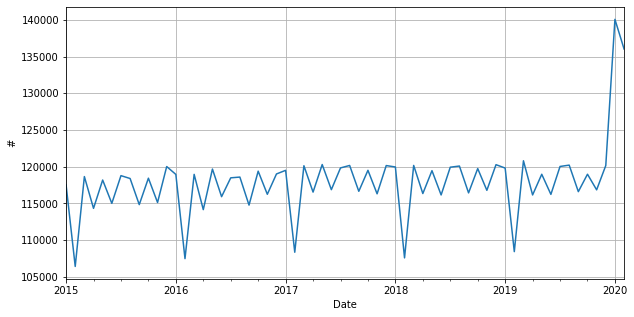

In [5]:
plt.figure(figsize=(10,5))
df.groupby('Date')['target'].count().plot()
plt.grid()
plt.ylabel('#')

#### Eliminación de los últimos meses de la base de datos para hacer este análisis. 

Text(0, 0.5, '#')

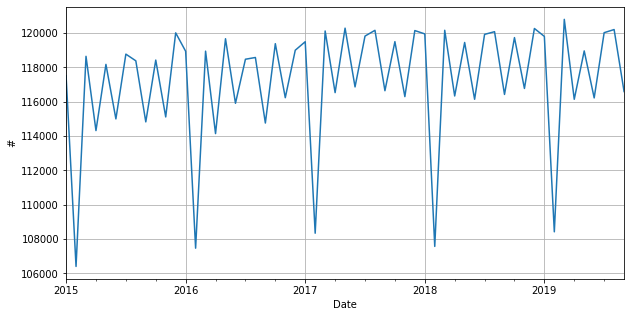

In [6]:
df = df.loc[(df.index < '2019-10-01')]
plt.figure(figsize=(10,5))
df.groupby('Date')['target'].count().plot()
plt.grid()
plt.ylabel('#')

### * FORECASTING:

#### Realización de forecasting para el primer estado. 

Se asumirá que los parámetros del modelo obtenido para este estado, son extensibles a todos los estados. Estudios más exhaustivos conllevan el estudio de un modelo por estado.

In [14]:
df['Merchant State'].head()

Date
2015-01-01    CA
2015-01-01    CA
2015-01-01    CA
2015-01-01    CA
2015-01-01    CA
Name: Merchant State, dtype: object

In [15]:
# Selección del primer estado:
df_group = df[df['Merchant State'] == 'CA'].groupby('Date').count()
df_group.index.freq='MS'

#### Estudio de las componentes de la distribución del número de transacciones en el tiempo

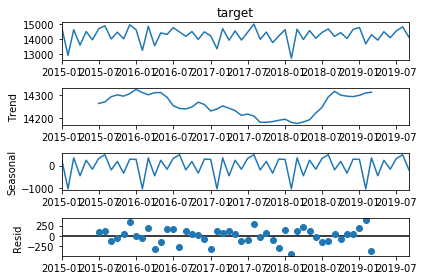

In [16]:
result = seasonal_decompose(df_group['target'], model='add')  # model='add' also works
result.plot();

#### Dividisión de la base de datos:

In [17]:
train = df_group.iloc[:45]
test = df_group.iloc[45:-4]

#### Entrenamiento del modelo SARIMAX:

In [18]:
model = SARIMAX(train['target'],order=(4,0,4),seasonal_order=(1,0,2,12))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                  target   No. Observations:                   45
Model:             SARIMAX(4, 0, 4)x(1, 0, [1, 2], 12)   Log Likelihood                -332.721
Date:                                 Wed, 11 Aug 2021   AIC                            689.441
Time:                                         20:32:03   BIC                            711.121
Sample:                                     01-01-2015   HQIC                           697.523
                                          - 09-01-2018                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6789      3.580     -0.190      0.850      -7.695       6.338
ar.L2          0.7539      2.324      0.324      0.746      -3.800       5.308
ar.L3          0.9653      2.559      0.377      0.706      -4.050       5.980
ar.L4         -0.0403      3.328     -0.012      0.990      -6.564       6.483
ma.L1          0.5458      3.590      0.152      0.879      -6.490       7.582
ma.L2         -0.8181      2.131     -0.384      0.701      -4.995       3.358
ma.L3         -0.8506      2.599     -0.327      0.743      -5.945       4.244
ma.L4          0.1689      3.100      0.054      0.957      -5.907       6.245
ar.S.L12       0.7924      1.005      0.789      0.430      -1.177       2.761
ma.S.L12      -0.3190      1.400     -0.228      0.820      -3.063       2.425
ma.S.L24       0.0066      1.285      0.005      0.996      -2.512       2.526
sigma2      1.853e+05      0.000    1.4e+09      0.000    1.85e+05    1.85e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.82   Jarque-Bera (JB):                 3.09
Prob(Q):                              0.37   Prob(JB):                         0.21
Heteroskedasticity (H):               0.55   Skew:                            -0.47
Prob(H) (two-sided):                  0.26   Kurtosis:                         3.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.65e+25. Standard errors may be unstable.
"""

#### Cálculo de predicciones:

In [19]:
start=len(train)
end=len(train)+len(test)-1
predictions = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMA(4,0,4)(1,0,2,12) Predictions')

#### Comparación de las predicciones con los datos de la base de datos:

In [20]:
# Compare predictions to expected values
for i in range(len(predictions)):
    print(f"predicted={predictions[i]:<11.10}, expected={test['target'][i]}")

predicted=14454.01304, expected=14413
predicted=13895.44398, expected=14029
predicted=14287.19873, expected=14631
predicted=14483.11828, expected=14756
predicted=13223.46047, expected=13681
predicted=14628.98339, expected=14284
predicted=13922.70337, expected=13923
predicted=14484.74928, expected=14477


####  Resultados en una figura

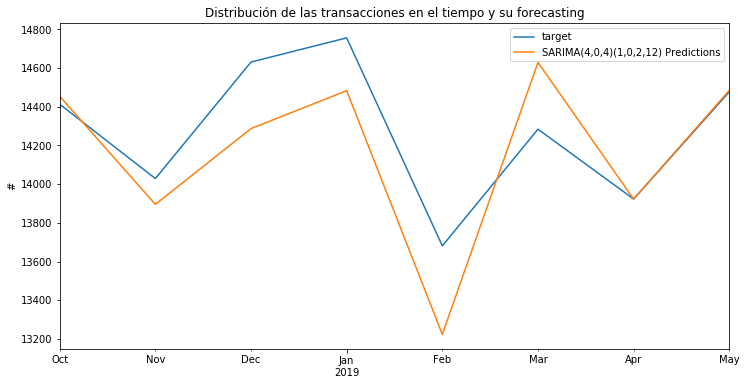

In [21]:
# Plot predictions against known values
title = 'Distribución de las transacciones en el tiempo y su forecasting'
ylabel='#'
xlabel=''

ax = test['target'].plot(legend=True,figsize=(12,6),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);


#### Cálculo del error del ajuste:

In [22]:
error = rmse(test['target'], predictions)
print(f'SARIMA(4,0,4)(1,0,2,12) RMSE Error: {error:11.10}')

SARIMA(4,0,4)(1,0,2,12) RMSE Error: 259.9517085


#### Aplicación del modelo a toda la base de datos

In [23]:
model = SARIMAX(df_group['target'],order=(4,0,4),seasonal_order=(1,0,2,12))
results = model.fit()
fcast = results.predict(len(df_group),len(df_group)+11,typ='levels').rename('SARIMA(4,0,4)(1,0,2,12) Forecast')

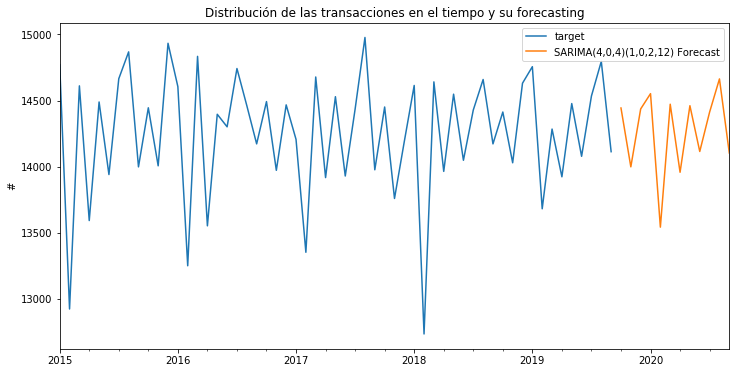

In [24]:
# Plot predictions against known values
title = 'Distribución de las transacciones en el tiempo y su forecasting'
ylabel='#'
xlabel=''

ax = df_group['target'].plot(legend=True,figsize=(12,6),title=title)
fcast.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

### Automatización del proceso:

In [55]:
def forecasting_analysis(df):

    list_errors = []
    list_media = []
    
    list_states = ['CA', 'MN', 'IL', 'AK', 'NJ', 'NV', 'MI', 'HI', 'TX', 'NY', 'AR',
                   'MA', 'PA', 'MO', 'OH', 'CT', 'CO', 'GA', 'ME', 'NH', 'VT',
                   'IA', 'MD', 'AL', 'KY', 'WI', 'DC', 'VA', 'NC', 'WA', 'NM',
                   'IN', 'OR', 'LA', 'DE', 'TN', 'ID', 'UT', 'SC', 'OK', 'MS', 'WV',
                   'ND', 'RI', 'NE', 'WY', 'KS', 'SD', 'MT']

    # Seleccionamos cada uno de los estados:
    for state in list_states:

        print('           *****  Estado :   {}  ******'.format(state))
        print('\n')
        print('\n')
        df_estado_group = df[df['Merchant State'] == state].groupby('Date').count()
        df_estado_group.index.freq = 'MS'
        df_estado_group.head()

        
        print('Distribución de transacciones')
        plt.figure(figsize=(10,5))
        df_estado_group['target'].plot()
        plt.grid()
        plt.ylabel('#')
        plt.show()
        print('\n')
        

        print('Componentes de la distribución de transacciones')
        sea_dec = seasonal_decompose(df_estado_group['2015-01-01':]['target'], model='add')
        sea_dec.plot()
        plt.show();     
        print('\n')


        print('Dividimos la base de datos')        
        train = df_estado_group.iloc[:45]
        test = df_estado_group.iloc[45:-4]
        print('\n')
        print('\n')

        
        print('Hacemos el forecasting.   ** Modelo SARIMAX**')  
        model = SARIMAX(train['target'],order=(4,0,4),seasonal_order=(1,0,2,12))
        results = model.fit()
        results.summary()
        print('\n')
        
       
        print('Hacemos las predicciones')
        start=len(train)
        end=len(train)+len(test)-1
        predictions = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMA(4,0,4)(1,0,2,12) Predictions')
        print('\n')

        
        print('Comparamos las predicciones con los datos de la base de datos')
        for i in range(len(predictions)):
            print(f"predicted={predictions[i]:<11.10}, expected={test['target'][i]}")
        
        title = 'Distribución de las transacciones en el tiempo y su forecasting'
        ylabel='#'
        xlabel=''
        ax = test['target'].plot(legend=True,figsize=(12,6),title=title)
        predictions.plot(legend=True)
        ax.autoscale(axis='x',tight=True)
        ax.set(xlabel=xlabel, ylabel=ylabel)
        plt.show();
        print('\n')

        
        print('* Calculamos el error del ajuste')
        error = rmse(test['target'], predictions)
        print(f'SARIMA(4,0,4)(1,0,2,12) RMSE Error: {error:11.10}')
        print('\n')
 

        print('Aplicamos el modelo a toda la base de datos')
        model = SARIMAX(df_estado_group['target'],order=(4,0,4),seasonal_order=(1,0,2,12))
        results = model.fit()
        print('\n')
        
        print('FORECASTING para el estado {}'.format(state))
        fcast = results.predict(len(df_estado_group),len(df_estado_group)+11,typ='levels').rename('SARIMA(4,0,4)(1,0,2,12) Forecast')

        list_errors.append(error/fcast.mean())
        list_media.append(fcast.mean())


        title = 'Distribución de las transacciones en el tiempo y su forecasting'
        ylabel='#'
        xlabel=''
        ax = df_estado_group['target'].plot(legend=True,figsize=(12,6),title=title)
        fcast.plot(legend=True)
        ax.autoscale(axis='x',tight=True)
        ax.set(xlabel=xlabel, ylabel=ylabel)
        plt.show();

        print('\n')

    return list_states, list_media, list_errors

           *****  Estado :   CA  ******




Distribución de transacciones


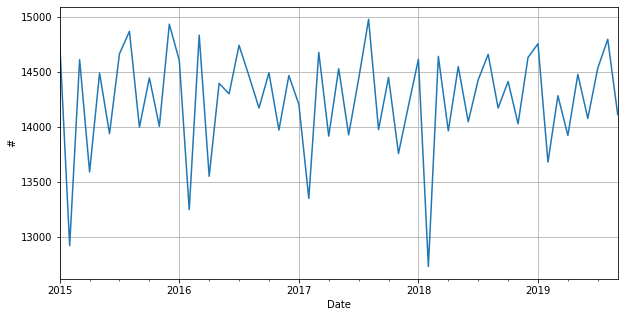



Componentes de la distribución de transacciones


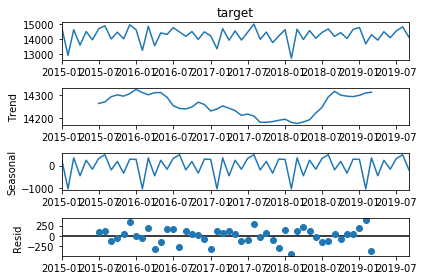



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=14454.01304, expected=14413
predicted=13895.44398, expected=14029
predicted=14287.19873, expected=14631
predicted=14483.11828, expected=14756
predicted=13223.46047, expected=13681
predicted=14628.98339, expected=14284
predicted=13922.70337, expected=13923
predicted=14484.74928, expected=14477


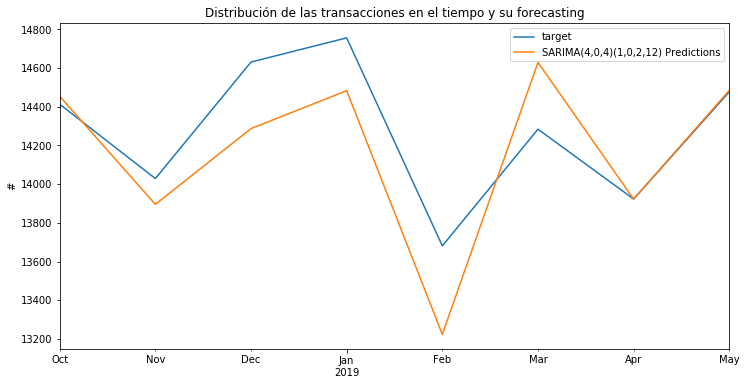



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 259.9517085


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado CA


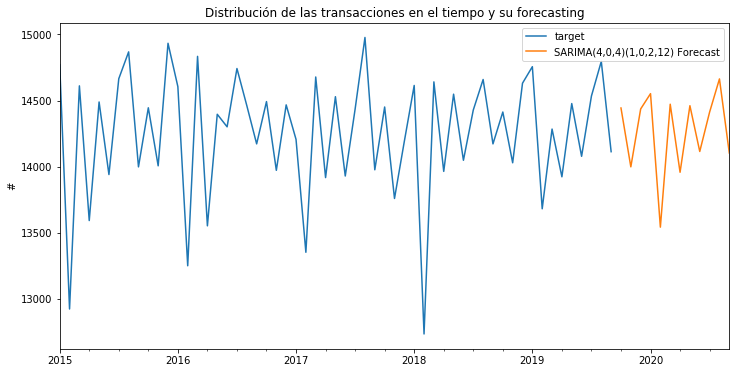



           *****  Estado :   MN  ******




Distribución de transacciones


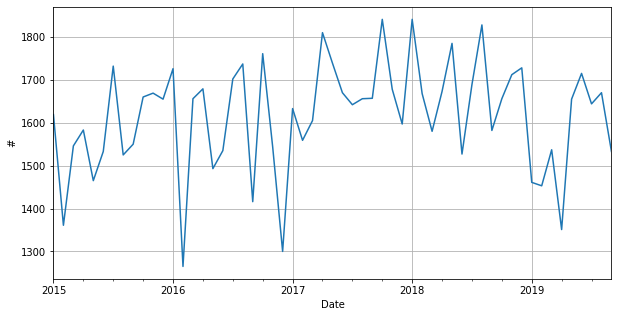



Componentes de la distribución de transacciones


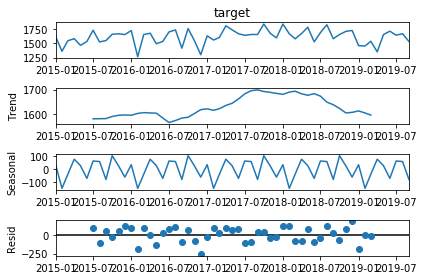



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1692.533501, expected=1656
predicted=1748.78863 , expected=1712
predicted=1607.165496, expected=1728
predicted=1661.676421, expected=1461
predicted=1727.389749, expected=1453
predicted=1635.356107, expected=1537
predicted=1664.932236, expected=1351
predicted=1750.074039, expected=1655


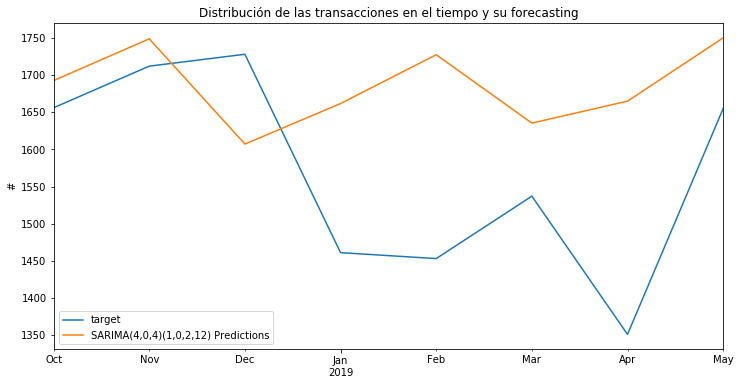



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 176.8178028


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MN


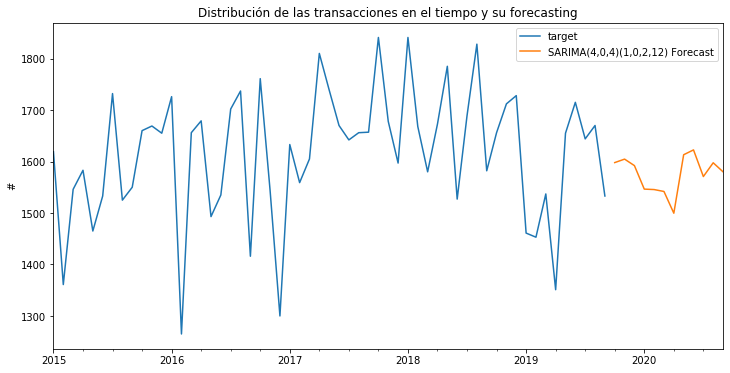



           *****  Estado :   IL  ******




Distribución de transacciones


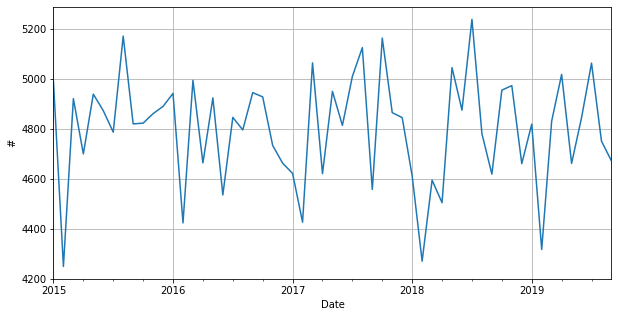



Componentes de la distribución de transacciones


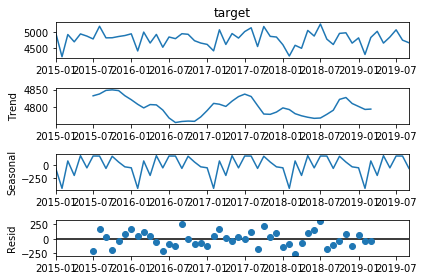



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=4770.36928 , expected=4954
predicted=4823.919959, expected=4972
predicted=4942.264919, expected=4660
predicted=4623.425045, expected=4818
predicted=4576.508475, expected=4317
predicted=4732.502118, expected=4830
predicted=4623.647177, expected=5017
predicted=4951.196226, expected=4661


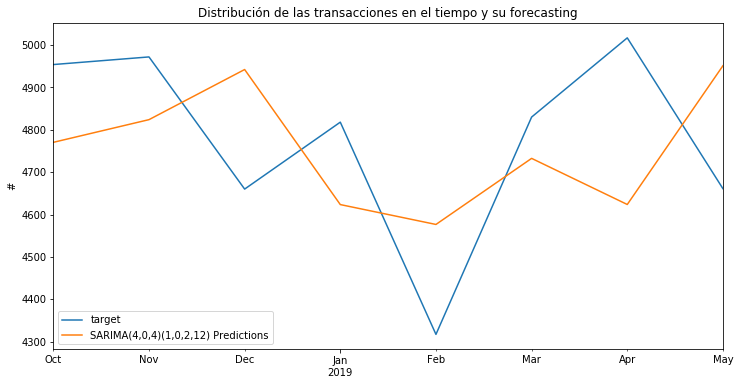



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 247.2275308


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado IL


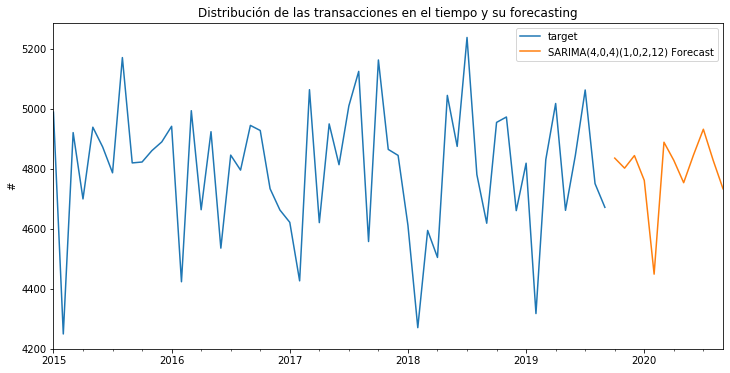



           *****  Estado :   AK  ******




Distribución de transacciones


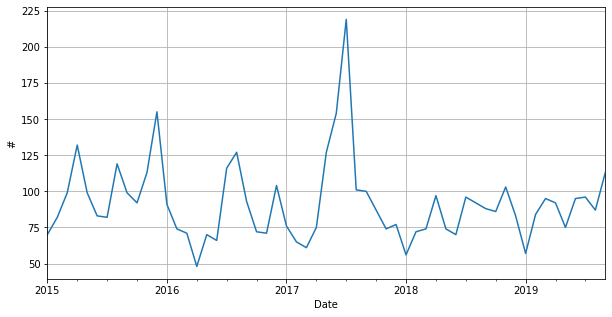



Componentes de la distribución de transacciones


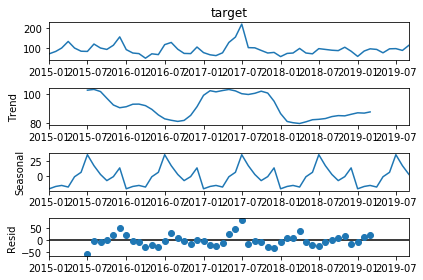



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=92.35190733, expected=86
predicted=90.71381078, expected=103
predicted=99.47617545, expected=83
predicted=88.44869843, expected=57
predicted=92.93473933, expected=84
predicted=89.87521817, expected=95
predicted=82.78225709, expected=92
predicted=71.30555737, expected=75


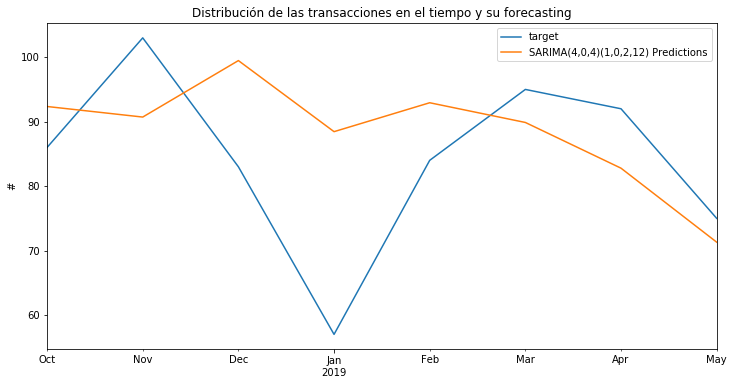



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 14.38962651


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado AK


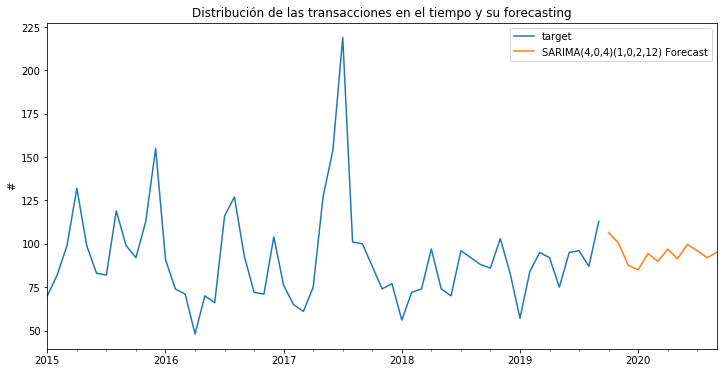



           *****  Estado :   NJ  ******




Distribución de transacciones


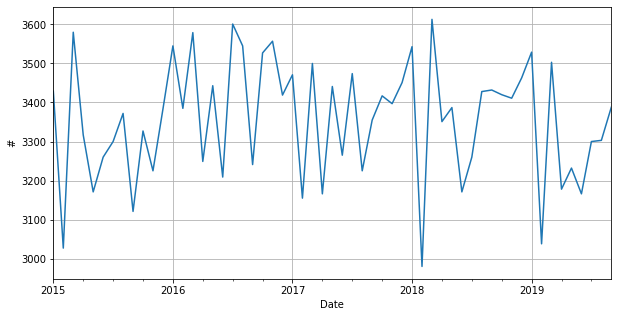



Componentes de la distribución de transacciones


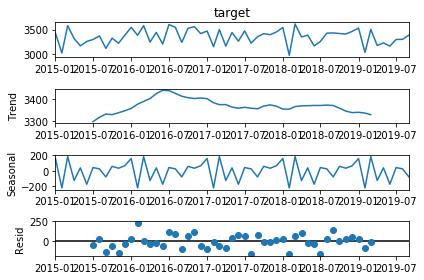



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=3368.66595 , expected=3420
predicted=3448.339052, expected=3411
predicted=3357.392744, expected=3463
predicted=3462.407921, expected=3529
predicted=3249.771726, expected=3038
predicted=3472.205463, expected=3503
predicted=3307.081125, expected=3178
predicted=3417.37217 , expected=3232


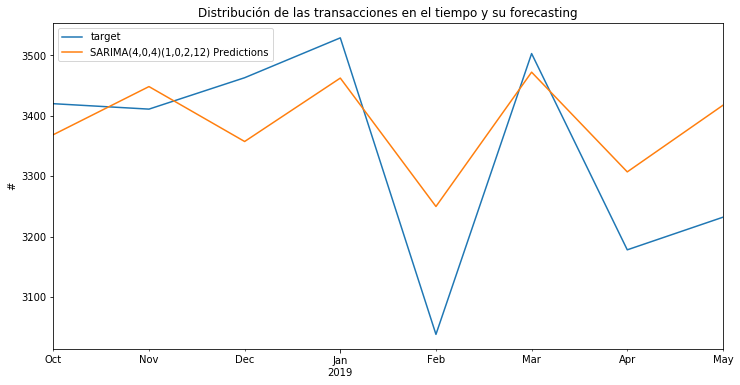



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 120.6426193


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NJ


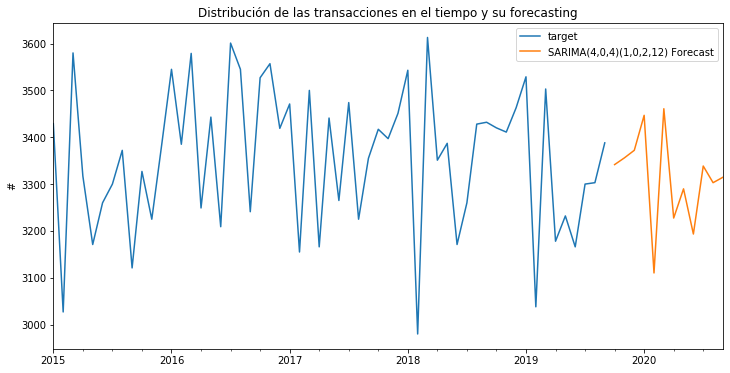



           *****  Estado :   NV  ******




Distribución de transacciones


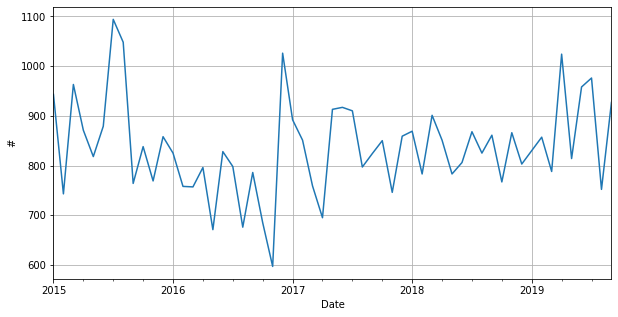



Componentes de la distribución de transacciones


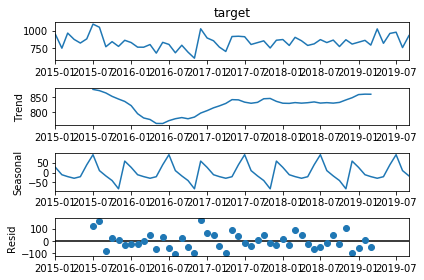



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=798.9501175, expected=767
predicted=792.1430364, expected=866
predicted=873.9823023, expected=803
predicted=835.8429293, expected=830
predicted=810.1677903, expected=857
predicted=840.3180954, expected=788
predicted=801.3286327, expected=1024
predicted=815.8151898, expected=814


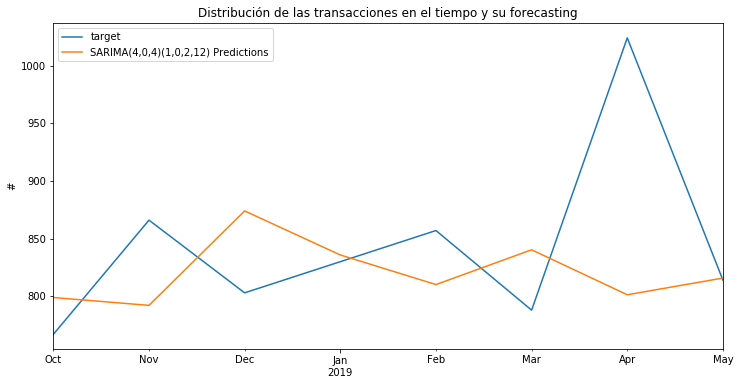



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 90.87392356


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NV


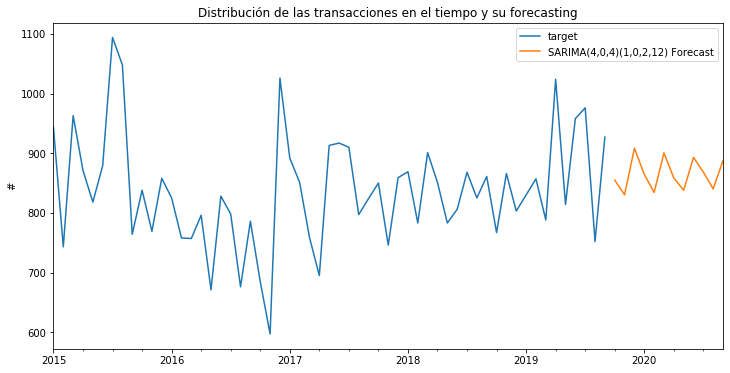



           *****  Estado :   MI  ******




Distribución de transacciones


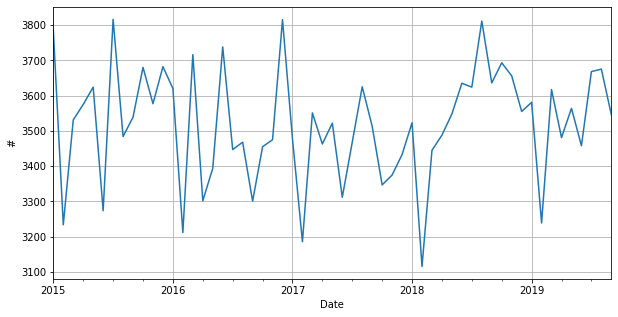



Componentes de la distribución de transacciones


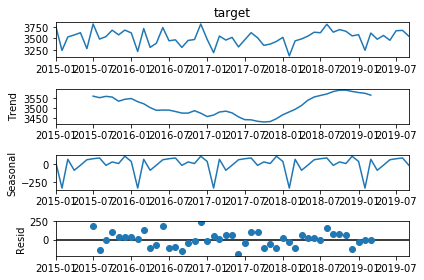



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=3438.864133, expected=3693
predicted=3535.881529, expected=3656
predicted=3594.522805, expected=3555
predicted=3495.110381, expected=3581
predicted=3359.873433, expected=3239
predicted=3553.517106, expected=3617
predicted=3411.334136, expected=3481
predicted=3564.128163, expected=3564


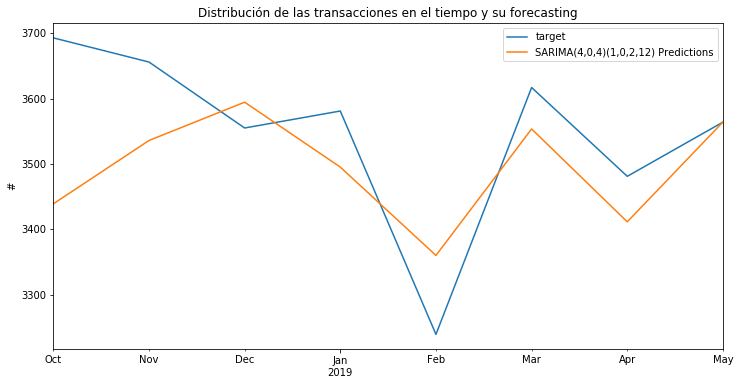



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 118.0287985


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MI


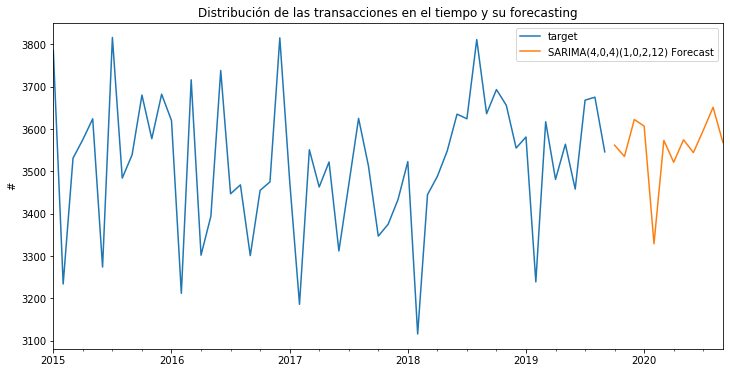



           *****  Estado :   HI  ******




Distribución de transacciones


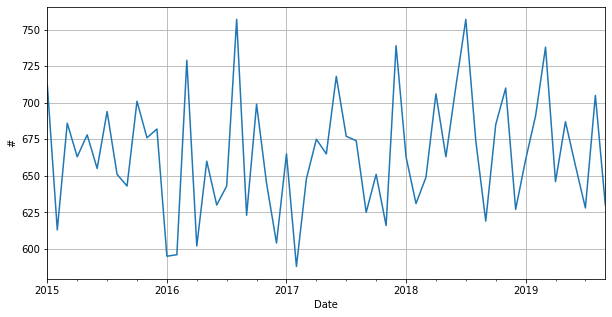



Componentes de la distribución de transacciones


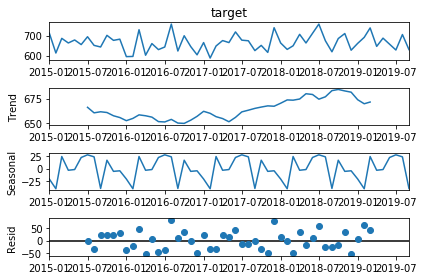



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=640.2247766, expected=685
predicted=669.8021486, expected=710
predicted=683.4630274, expected=627
predicted=656.9395491, expected=661
predicted=658.9540344, expected=691
predicted=661.5317495, expected=738
predicted=666.2459605, expected=646
predicted=681.1473282, expected=687


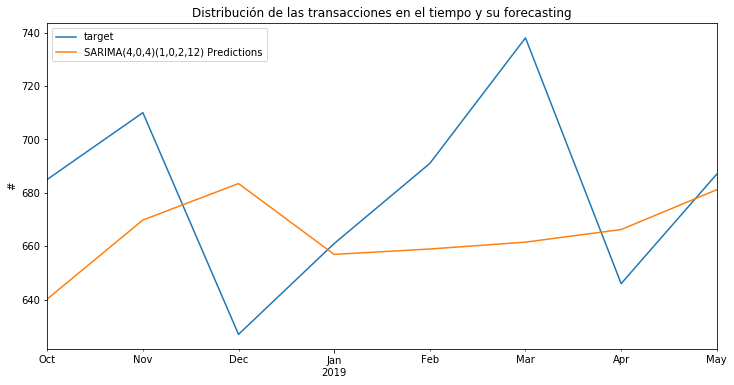



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 42.04720345


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado HI


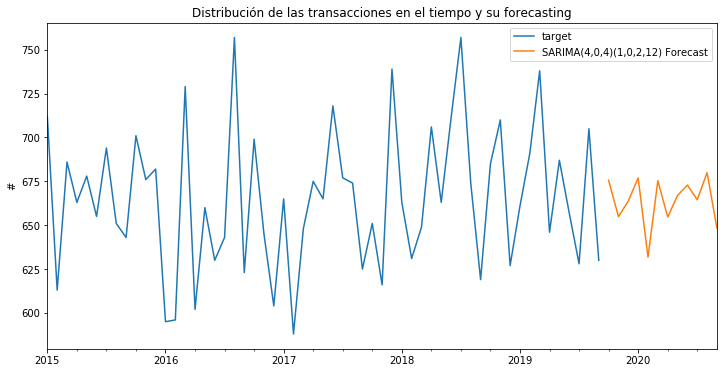



           *****  Estado :   TX  ******




Distribución de transacciones


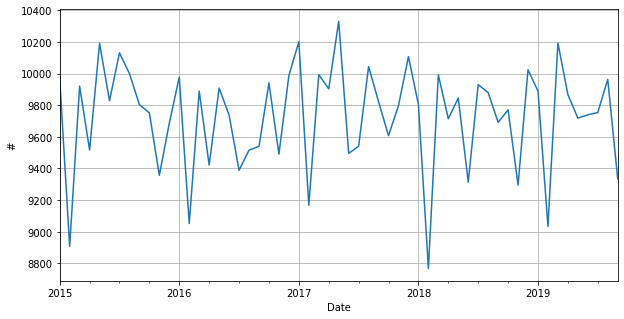



Componentes de la distribución de transacciones


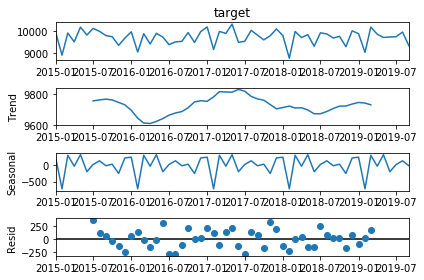



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=9719.909253, expected=9770
predicted=9888.986014, expected=9294
predicted=9800.617132, expected=10024
predicted=9728.123062, expected=9889
predicted=9172.350636, expected=9033
predicted=9918.760322, expected=10193
predicted=9495.649384, expected=9867
predicted=9858.046854, expected=9718


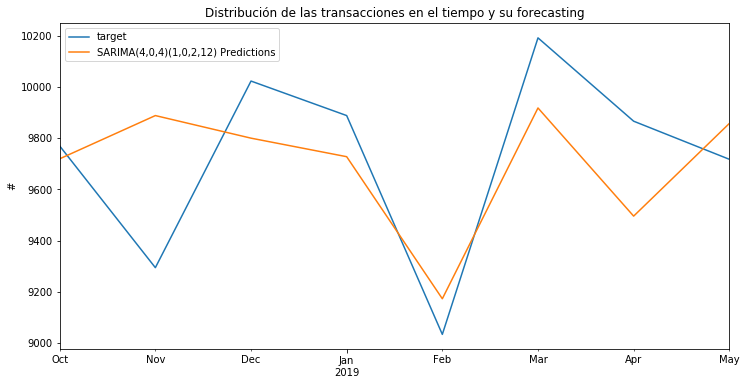



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 292.4976787


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado TX


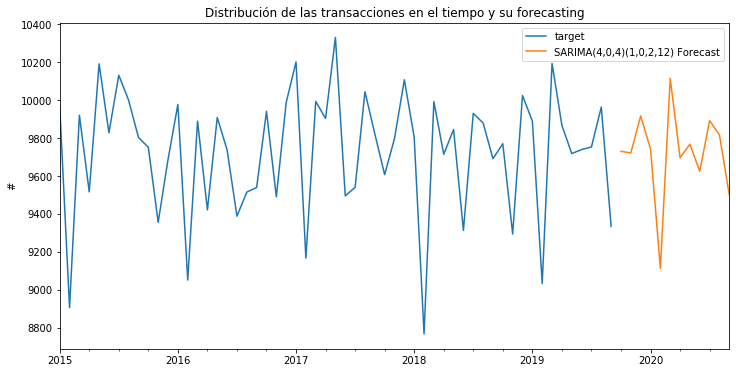



           *****  Estado :   NY  ******




Distribución de transacciones


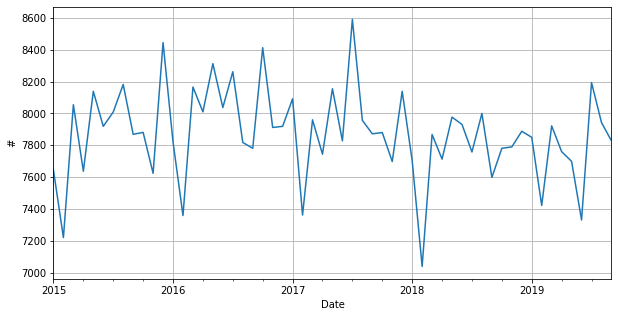



Componentes de la distribución de transacciones


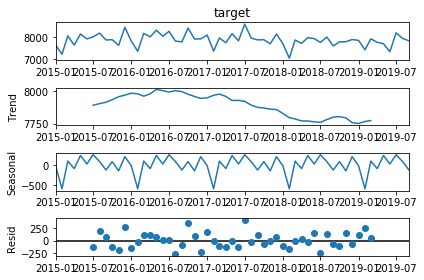



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=7994.292022, expected=7781
predicted=7684.979023, expected=7790
predicted=7914.978648, expected=7888
predicted=7771.141294, expected=7850
predicted=7347.826111, expected=7422
predicted=7812.564525, expected=7922
predicted=7697.763226, expected=7760
predicted=7952.089254, expected=7699


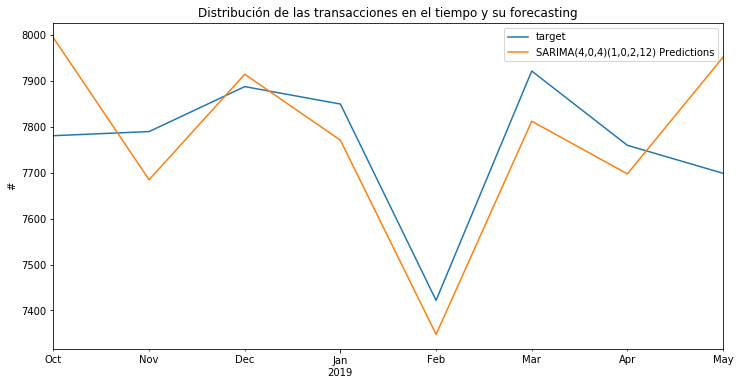



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 136.4161421


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NY


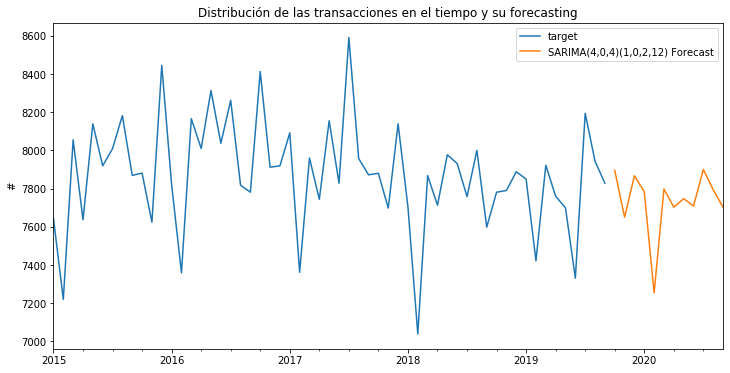



           *****  Estado :   AR  ******




Distribución de transacciones


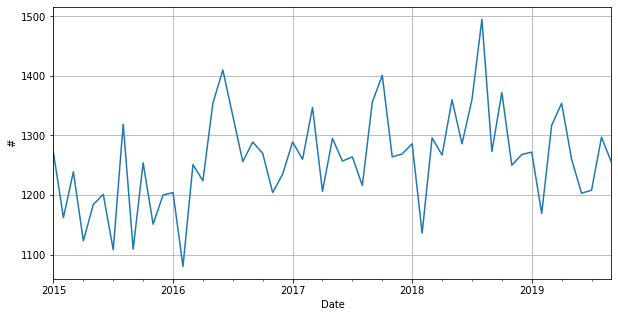



Componentes de la distribución de transacciones


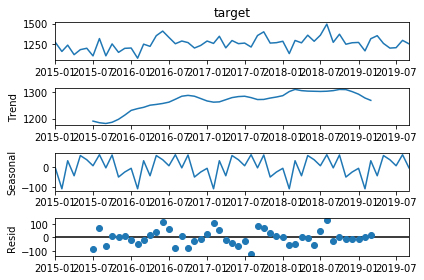



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1381.244582, expected=1372
predicted=1262.238259, expected=1250
predicted=1329.149103, expected=1268
predicted=1353.906664, expected=1272
predicted=1272.751282, expected=1169
predicted=1398.788837, expected=1317
predicted=1282.240067, expected=1354
predicted=1374.349361, expected=1260


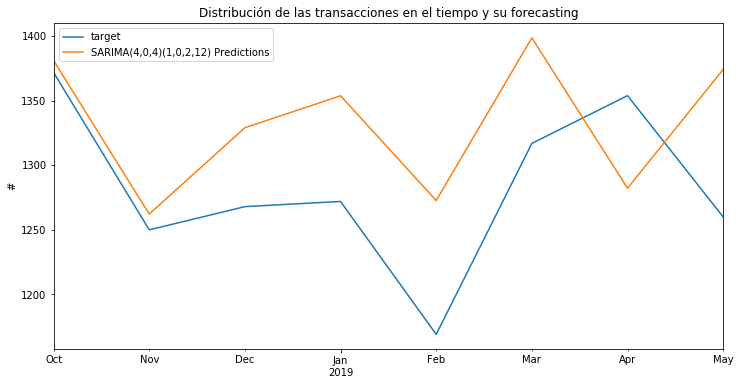



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 76.12666939


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado AR


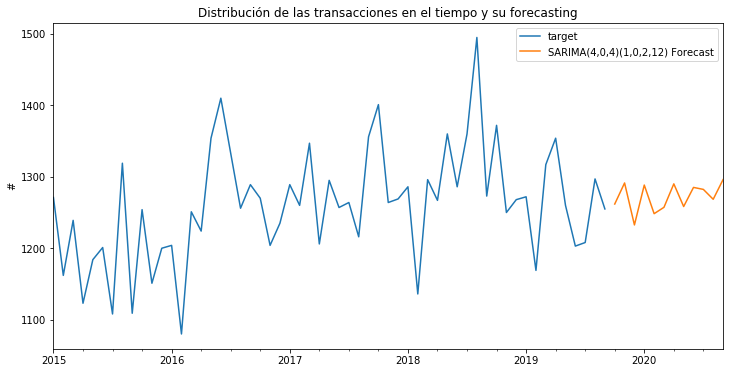



           *****  Estado :   MA  ******




Distribución de transacciones


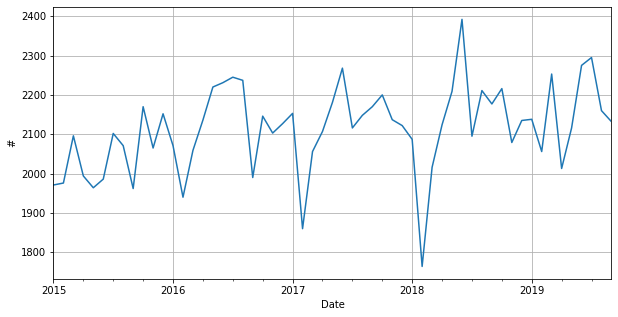



Componentes de la distribución de transacciones


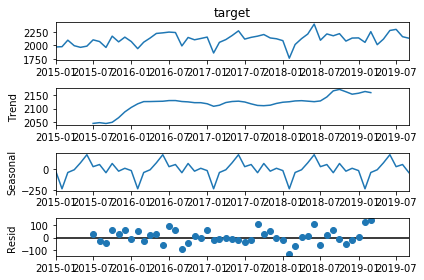



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=2137.090925, expected=2216
predicted=2188.86389 , expected=2079
predicted=2079.415553, expected=2135
predicted=2101.902167, expected=2138
predicted=1916.189475, expected=2056
predicted=2044.308415, expected=2253
predicted=2106.878397, expected=2013
predicted=2174.080221, expected=2116


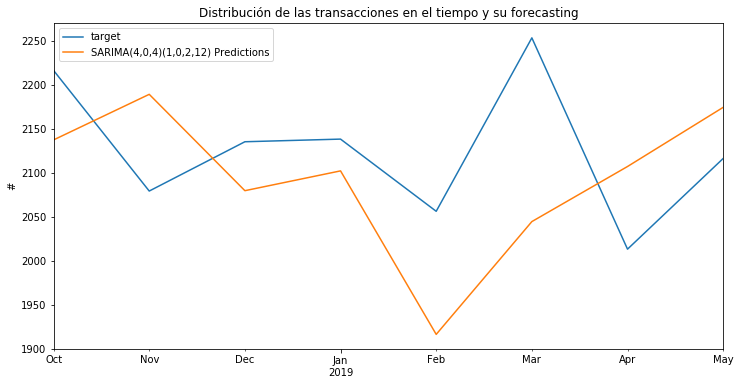



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 110.6656151


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MA


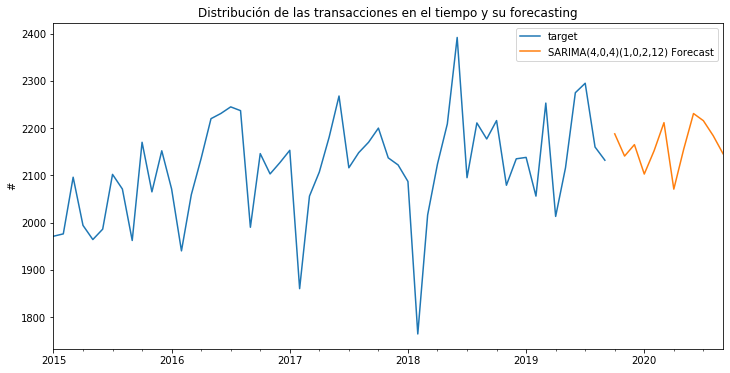



           *****  Estado :   PA  ******




Distribución de transacciones


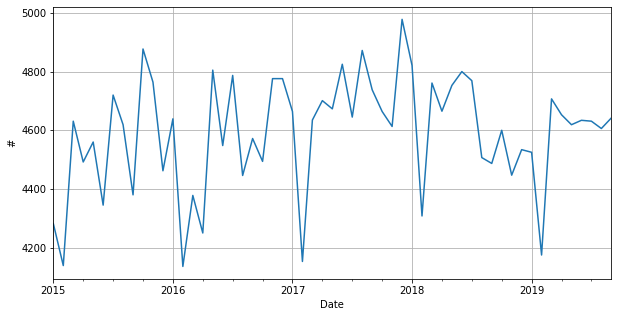



Componentes de la distribución de transacciones


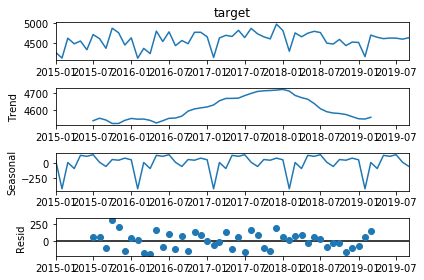



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=4690.991318, expected=4600
predicted=4697.209964, expected=4447
predicted=4766.342512, expected=4534
predicted=4808.080058, expected=4525
predicted=4511.786646, expected=4175
predicted=4646.135943, expected=4707
predicted=4747.957454, expected=4653
predicted=4762.421854, expected=4619


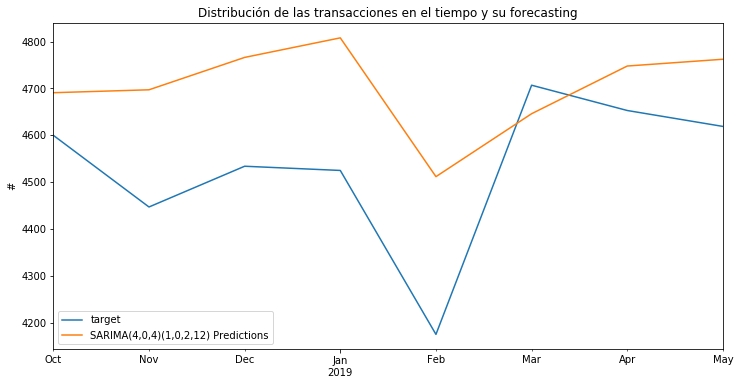



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 209.6777983


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado PA


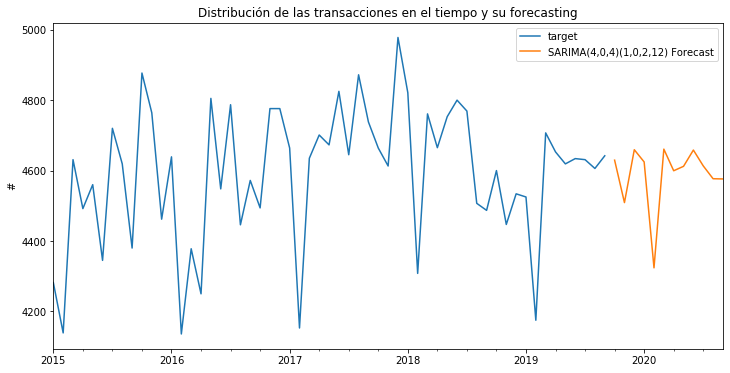



           *****  Estado :   MO  ******




Distribución de transacciones


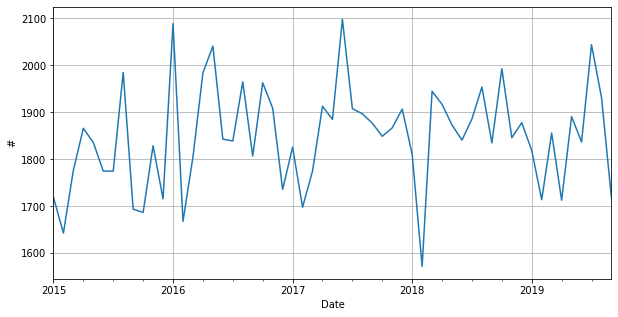



Componentes de la distribución de transacciones


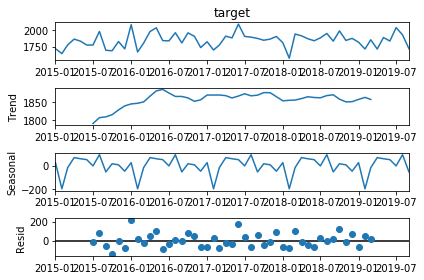



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1854.48871 , expected=1993
predicted=1897.757266, expected=1846
predicted=1831.7441  , expected=1878
predicted=1868.604279, expected=1819
predicted=1785.921181, expected=1714
predicted=1836.377246, expected=1856
predicted=1914.04868 , expected=1713
predicted=1948.918719, expected=1891


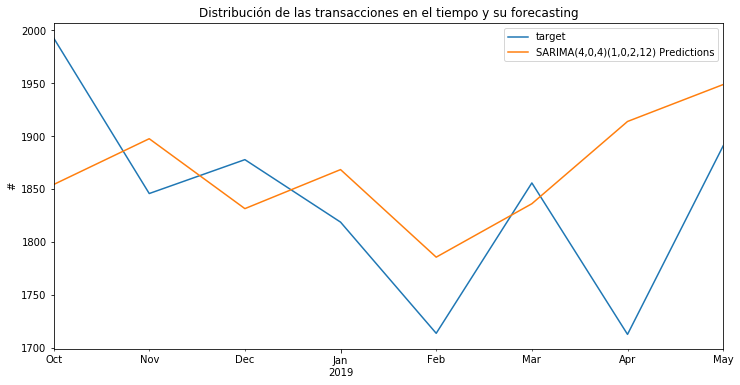



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 97.33784168


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MO


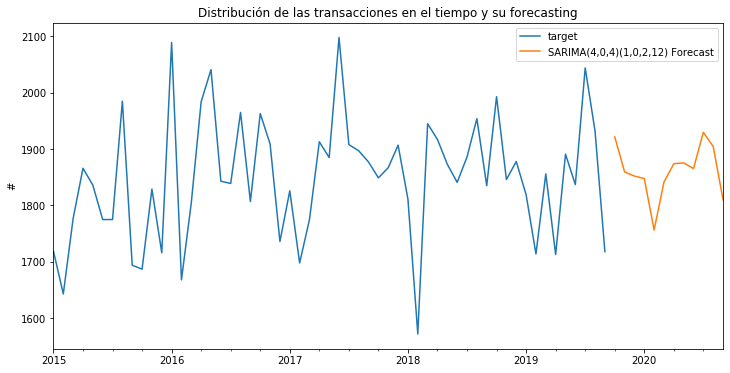



           *****  Estado :   OH  ******




Distribución de transacciones


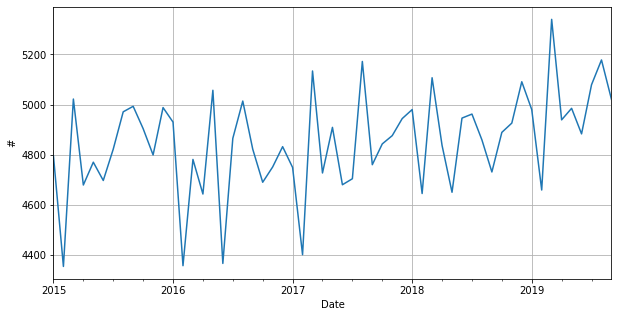



Componentes de la distribución de transacciones


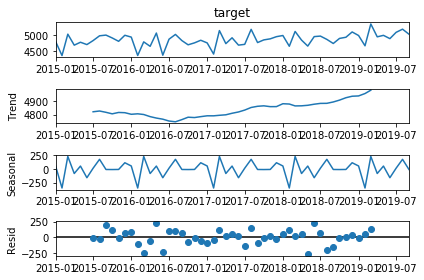



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=4939.777035, expected=4889
predicted=4823.420219, expected=4926
predicted=4848.865215, expected=5091
predicted=4920.336458, expected=4980
predicted=4766.425182, expected=4659
predicted=4949.424938, expected=5340
predicted=4771.562081, expected=4939
predicted=4826.745539, expected=4985


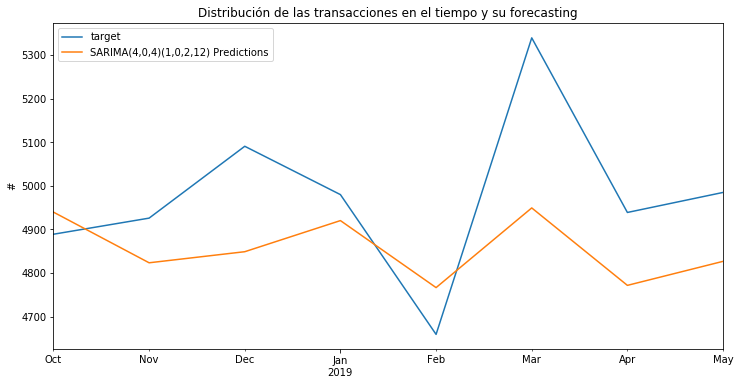



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 191.1997943


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado OH


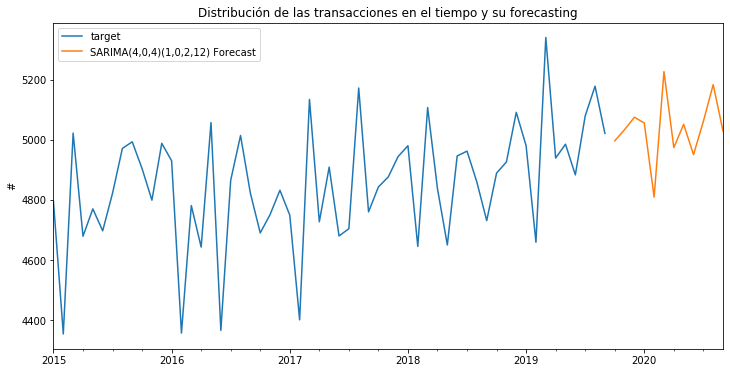



           *****  Estado :   CT  ******




Distribución de transacciones


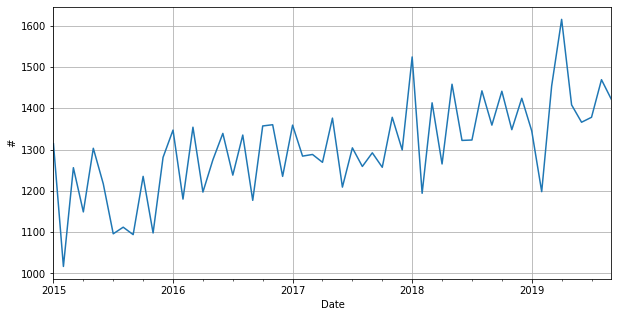



Componentes de la distribución de transacciones


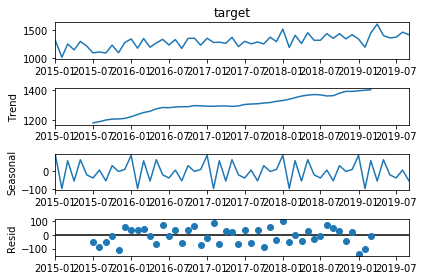



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1422.417555, expected=1441
predicted=1388.118843, expected=1348
predicted=1384.664743, expected=1424
predicted=1464.505788, expected=1345
predicted=1356.823076, expected=1198
predicted=1448.936691, expected=1454
predicted=1375.129607, expected=1615
predicted=1447.060345, expected=1408


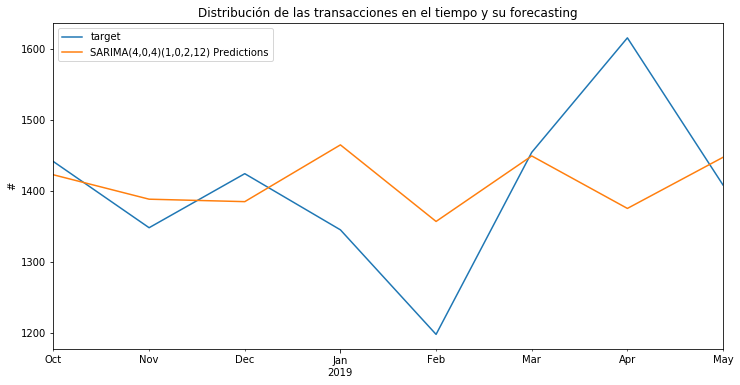



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 112.9699336


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado CT


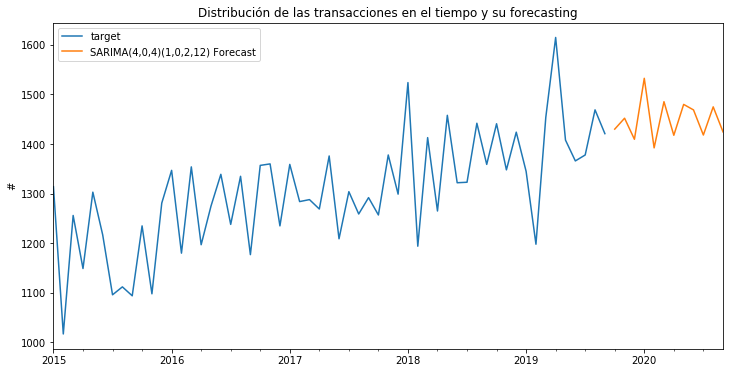



           *****  Estado :   CO  ******




Distribución de transacciones


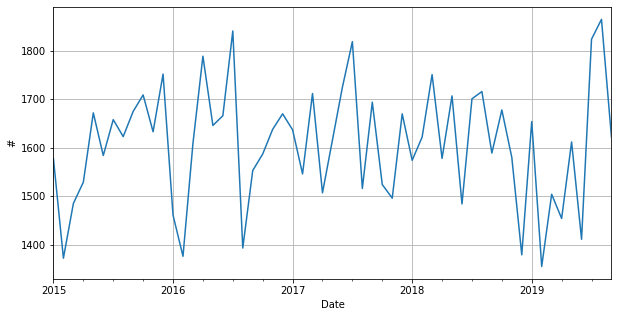



Componentes de la distribución de transacciones


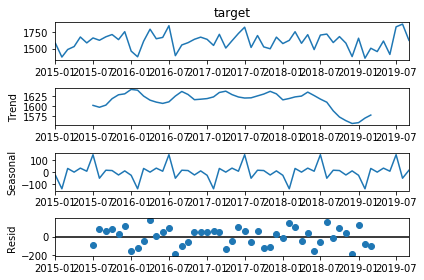



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1537.032523, expected=1678
predicted=1609.602544, expected=1580
predicted=1659.692554, expected=1379
predicted=1532.977496, expected=1654
predicted=1602.281343, expected=1355
predicted=1723.800776, expected=1504
predicted=1603.331168, expected=1454
predicted=1614.115341, expected=1612


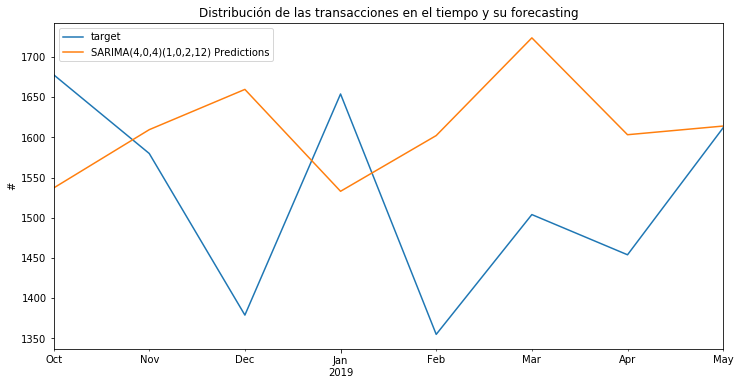



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 175.3381065


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado CO


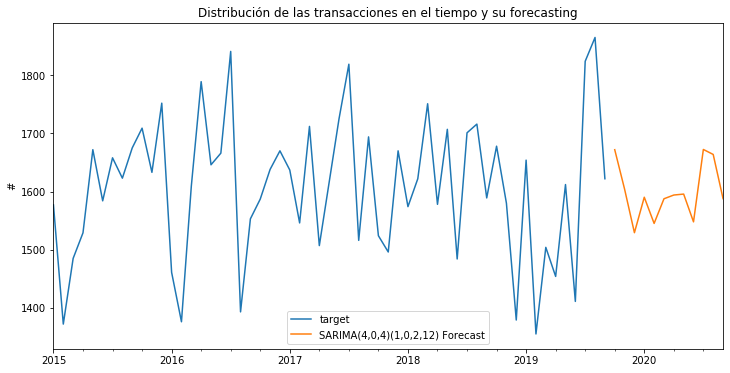



           *****  Estado :   GA  ******




Distribución de transacciones


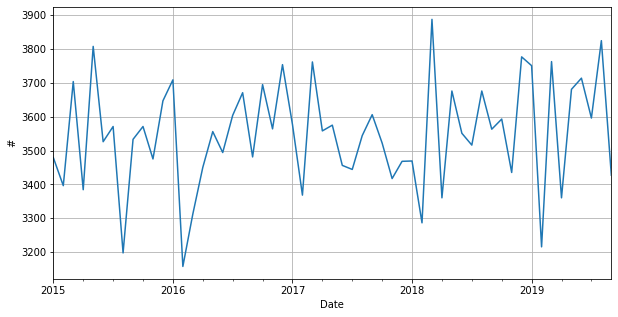



Componentes de la distribución de transacciones


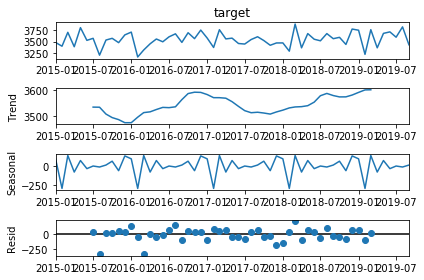



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=3565.556834, expected=3593
predicted=3566.788146, expected=3435
predicted=3555.137012, expected=3777
predicted=3532.725451, expected=3751
predicted=3444.378719, expected=3215
predicted=3634.055078, expected=3763
predicted=3493.840241, expected=3360
predicted=3583.107375, expected=3681


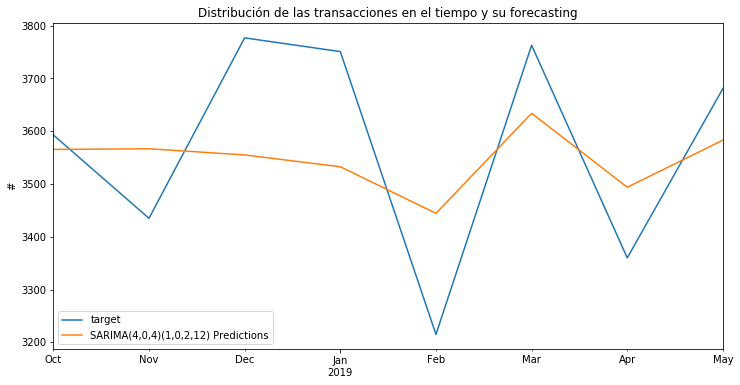



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 162.6828867


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado GA


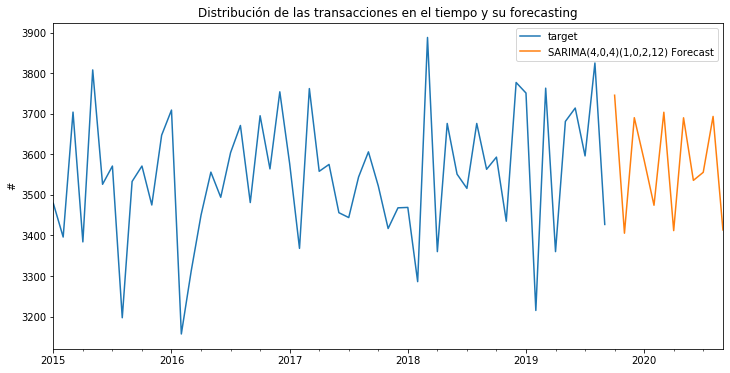



           *****  Estado :   ME  ******




Distribución de transacciones


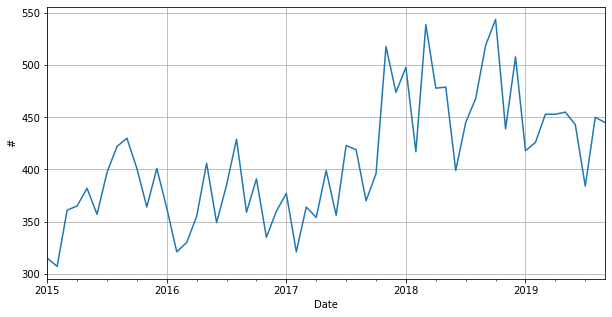



Componentes de la distribución de transacciones


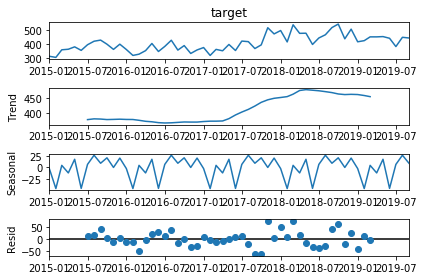



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=452.4159231, expected=544
predicted=514.4251172, expected=439
predicted=500.0023574, expected=508
predicted=554.8880091, expected=418
predicted=520.197587 , expected=426
predicted=514.5895889, expected=453
predicted=454.3172743, expected=453
predicted=476.2538214, expected=455


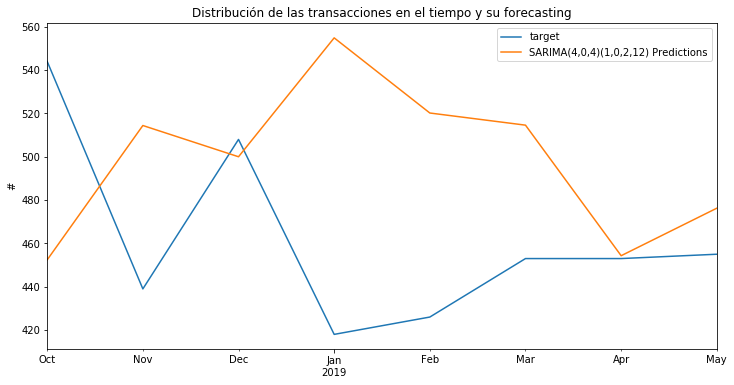



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 75.82776845


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado ME


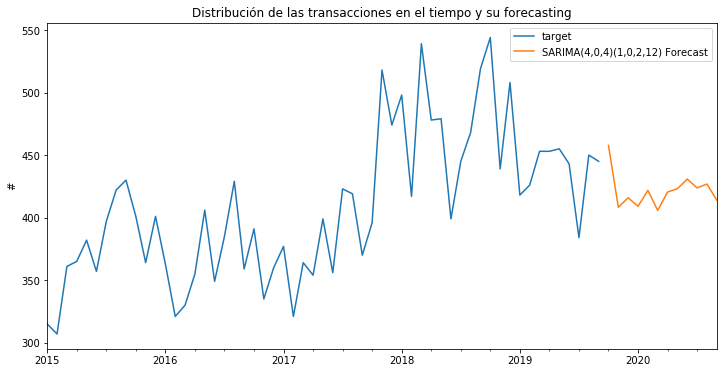



           *****  Estado :   NH  ******




Distribución de transacciones


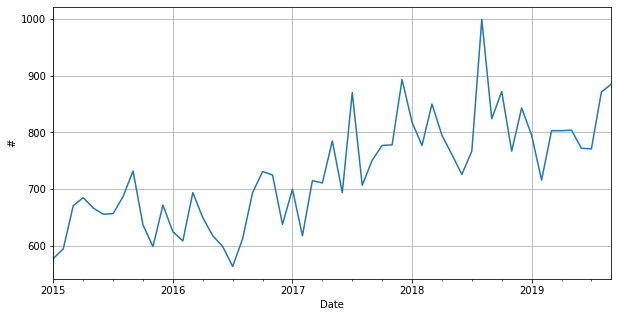



Componentes de la distribución de transacciones


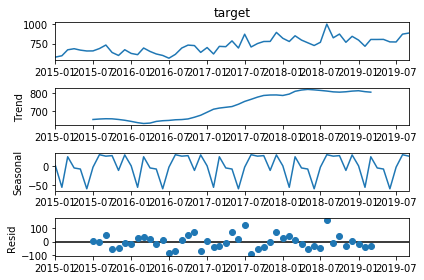



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=852.4329439, expected=872
predicted=850.5792585, expected=767
predicted=811.511065 , expected=843
predicted=849.5429925, expected=795
predicted=828.1247687, expected=716
predicted=830.2789079, expected=803
predicted=857.3132215, expected=803
predicted=839.1257171, expected=804


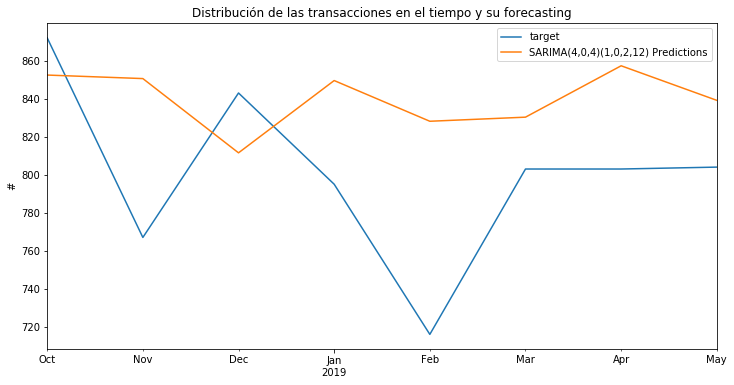



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 60.03613265


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NH


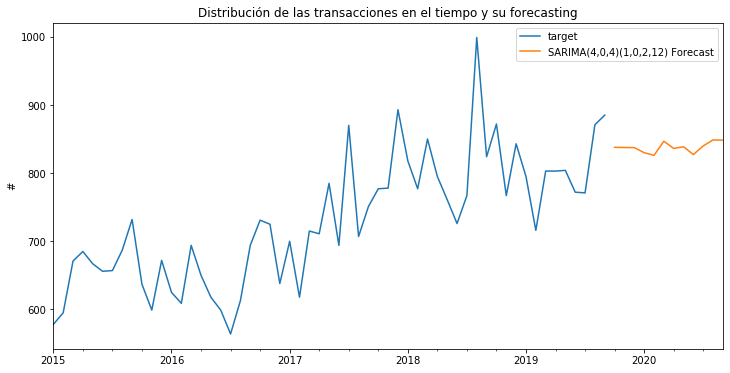



           *****  Estado :   VT  ******




Distribución de transacciones


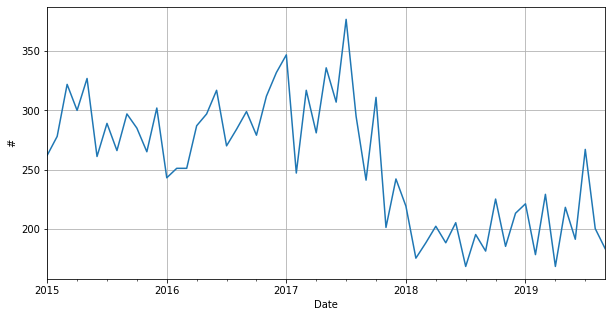



Componentes de la distribución de transacciones


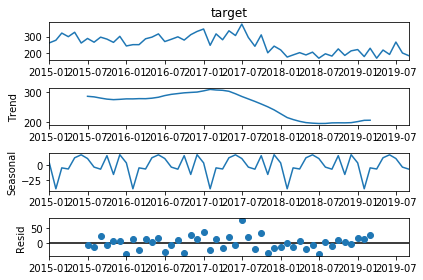



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=191.3221388, expected=225
predicted=221.617071 , expected=185
predicted=219.0496064, expected=213
predicted=217.5716814, expected=221
predicted=193.8717304, expected=178
predicted=218.4995742, expected=229
predicted=208.0397318, expected=168
predicted=221.6232804, expected=218


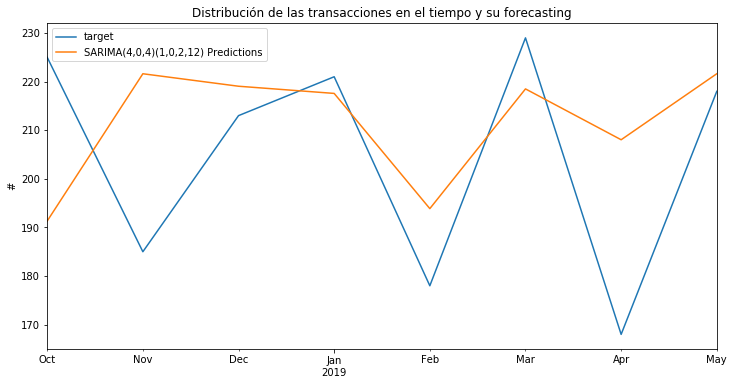



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 23.72192653


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado VT


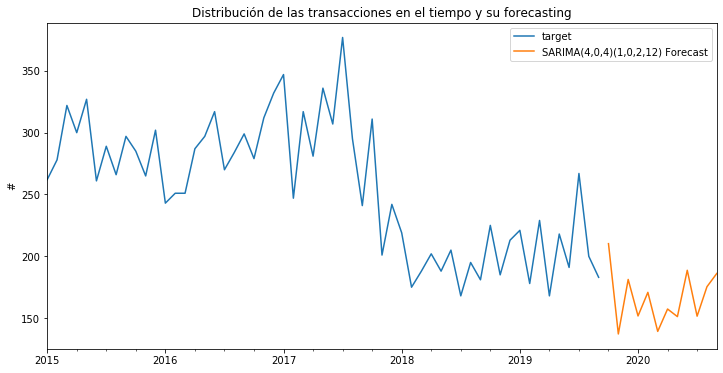



           *****  Estado :   IA  ******




Distribución de transacciones


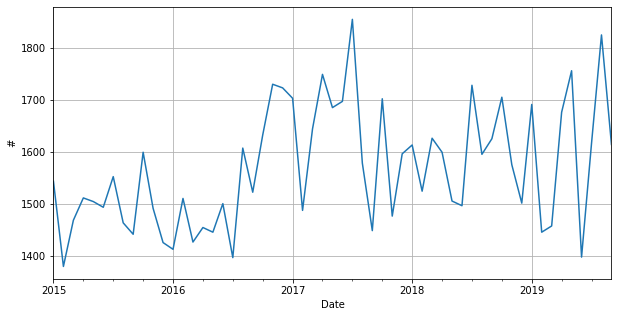



Componentes de la distribución de transacciones


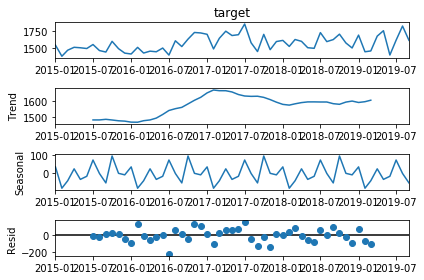



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1680.045558, expected=1705
predicted=1640.313627, expected=1575
predicted=1648.601212, expected=1501
predicted=1738.611639, expected=1691
predicted=1572.438876, expected=1445
predicted=1632.430264, expected=1457
predicted=1733.395404, expected=1676
predicted=1633.256496, expected=1756


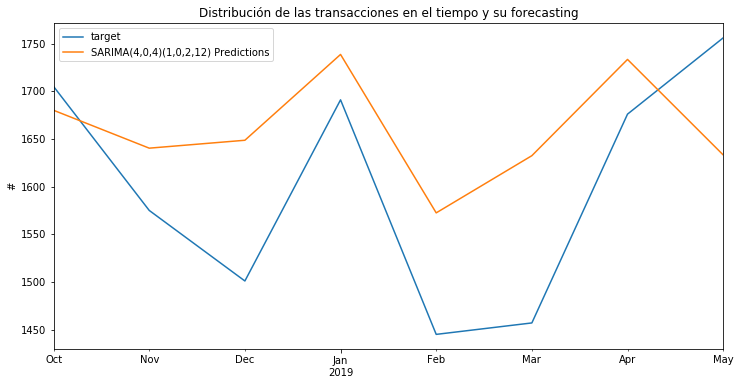



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 108.5807446


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado IA


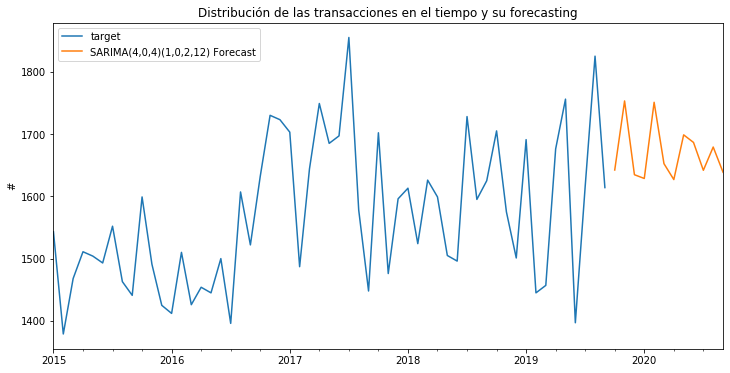



           *****  Estado :   MD  ******




Distribución de transacciones


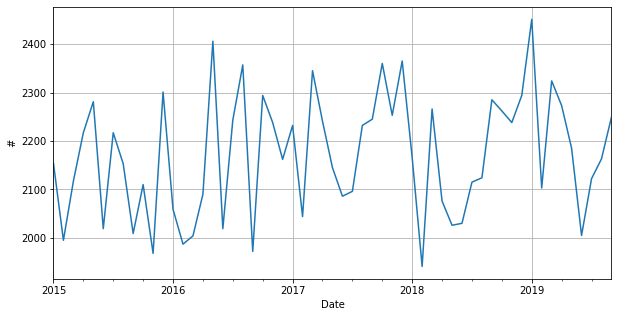



Componentes de la distribución de transacciones


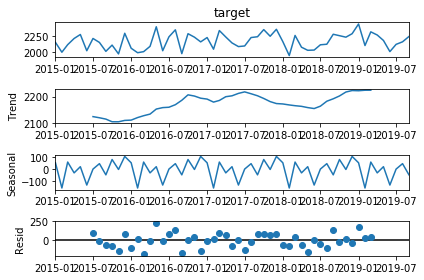



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=2310.318723, expected=2262
predicted=2106.524581, expected=2238
predicted=2327.761999, expected=2294
predicted=2098.03874 , expected=2451
predicted=2080.899522, expected=2103
predicted=2170.058773, expected=2324
predicted=2086.334081, expected=2273
predicted=2146.649139, expected=2185


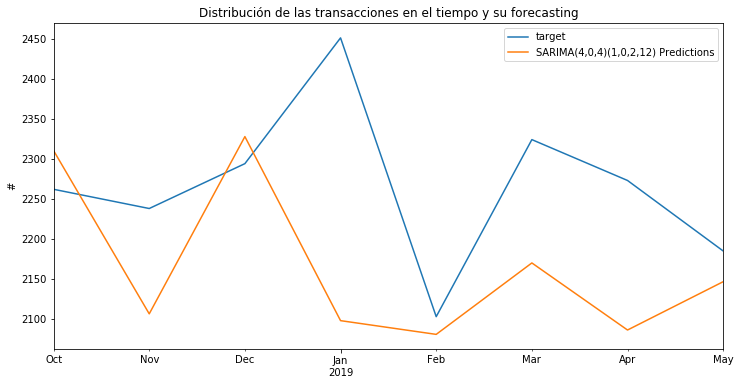



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 160.4070194


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MD


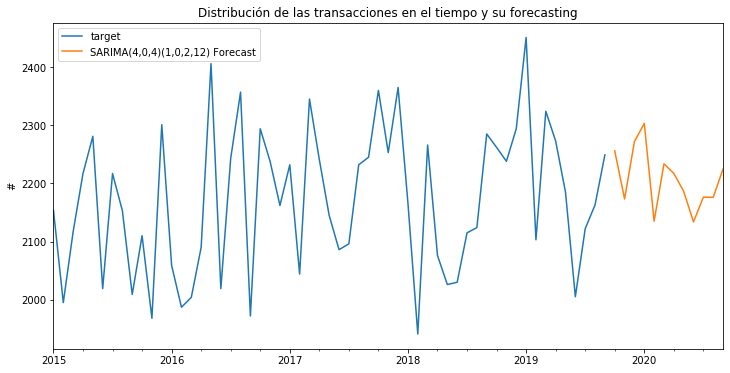



           *****  Estado :   AL  ******




Distribución de transacciones


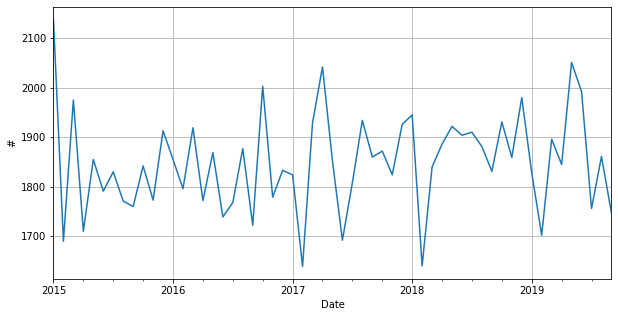



Componentes de la distribución de transacciones


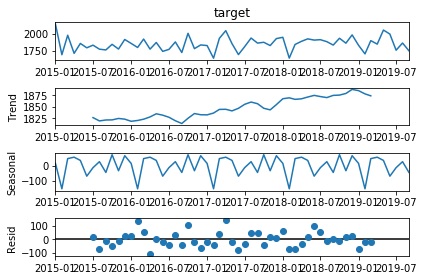



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1876.049619, expected=1931
predicted=1823.68324 , expected=1859
predicted=1893.269677, expected=1980
predicted=1917.98677 , expected=1828
predicted=1757.113089, expected=1702
predicted=1859.333104, expected=1896
predicted=1861.299151, expected=1845
predicted=1879.165157, expected=2051


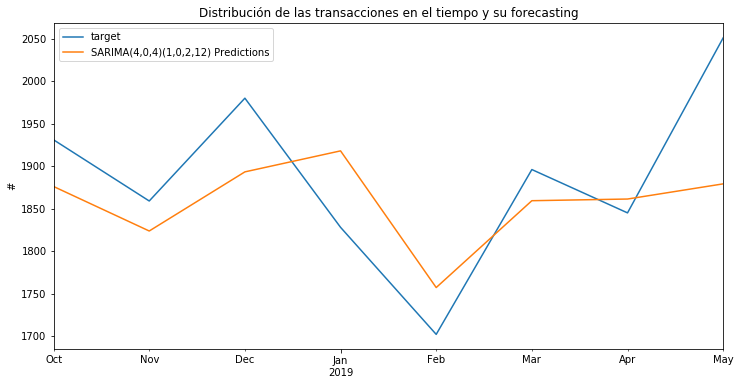



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error:  82.2050599


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado AL


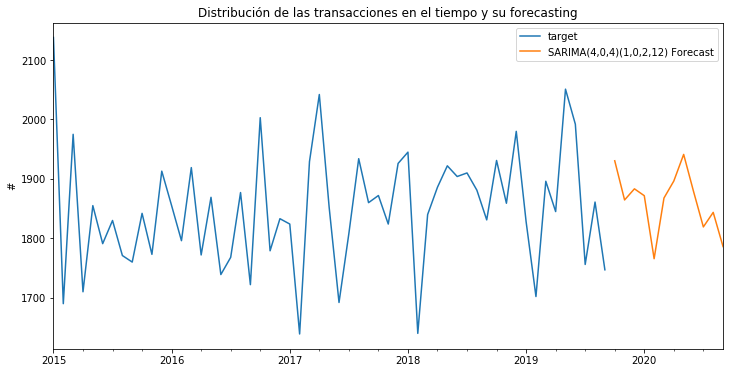



           *****  Estado :   KY  ******




Distribución de transacciones


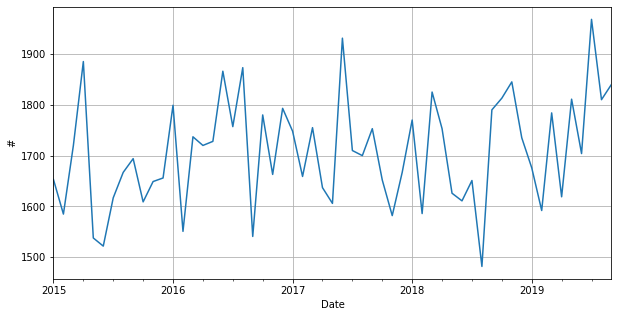



Componentes de la distribución de transacciones


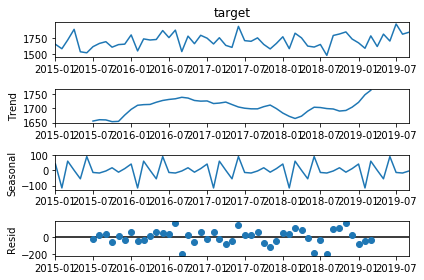



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1675.394616, expected=1813
predicted=1638.67341 , expected=1845
predicted=1700.836294, expected=1735
predicted=1699.257848, expected=1676
predicted=1643.124785, expected=1592
predicted=1714.630968, expected=1784
predicted=1702.247696, expected=1619
predicted=1676.82643 , expected=1811


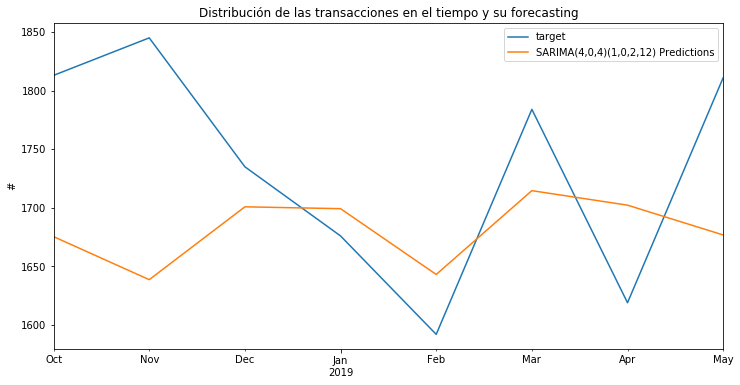



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 109.3003441


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado KY


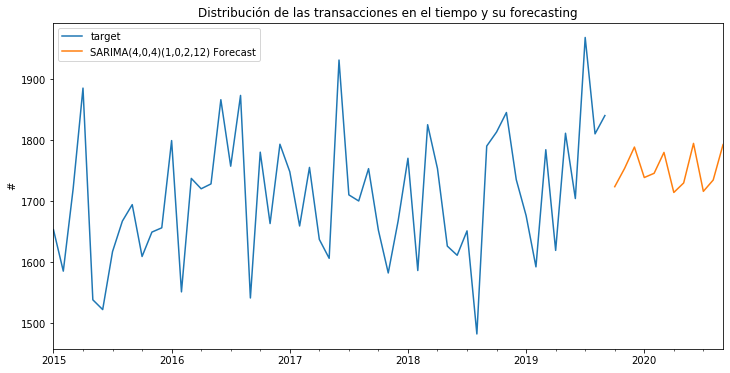



           *****  Estado :   WI  ******




Distribución de transacciones


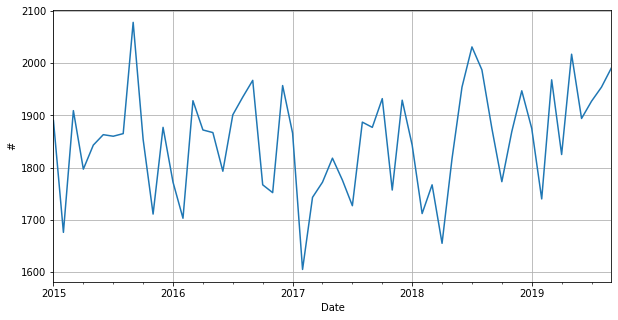



Componentes de la distribución de transacciones


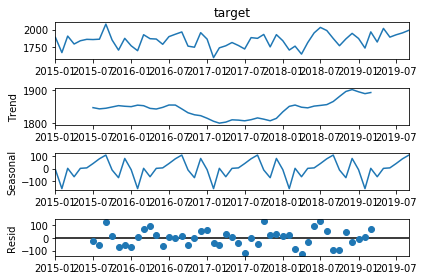



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1854.362897, expected=1773
predicted=1778.534159, expected=1869
predicted=1903.502702, expected=1947
predicted=1829.110979, expected=1875
predicted=1724.83412 , expected=1740
predicted=1828.729955, expected=1968
predicted=1770.909364, expected=1825
predicted=1824.69342 , expected=2017


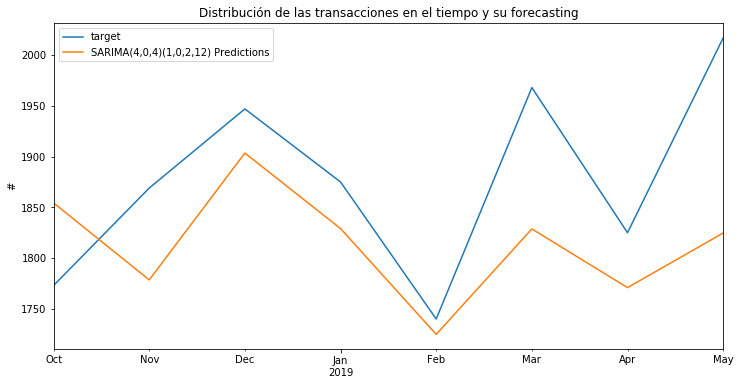



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error:  98.9542657


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado WI


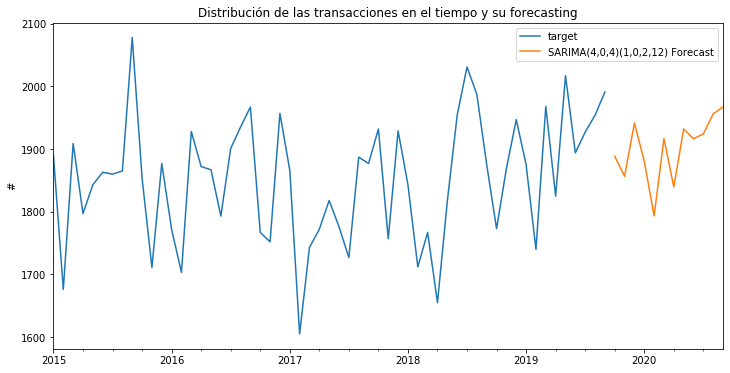



           *****  Estado :   DC  ******




Distribución de transacciones


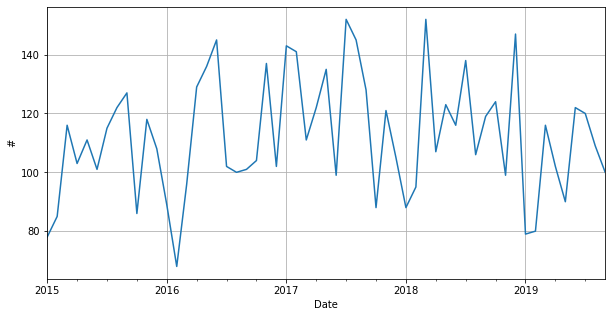



Componentes de la distribución de transacciones


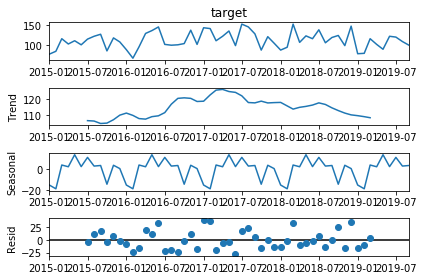



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=103.9132791, expected=124
predicted=132.8439925, expected=99
predicted=102.5488758, expected=147
predicted=121.3659278, expected=79
predicted=92.67405602, expected=80
predicted=99.82238406, expected=116
predicted=115.4493844, expected=102
predicted=128.6979458, expected=90


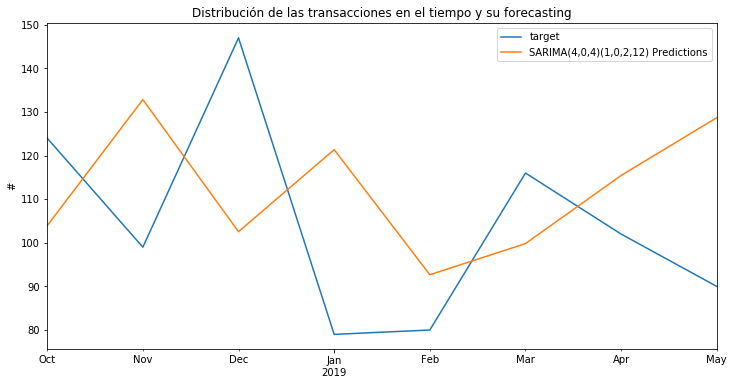



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 30.45576785


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado DC


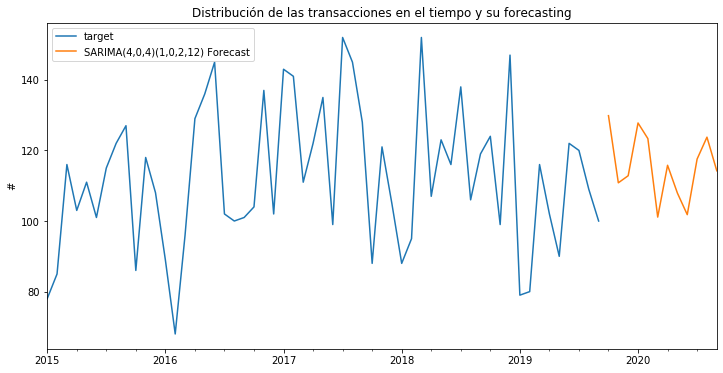



           *****  Estado :   VA  ******




Distribución de transacciones


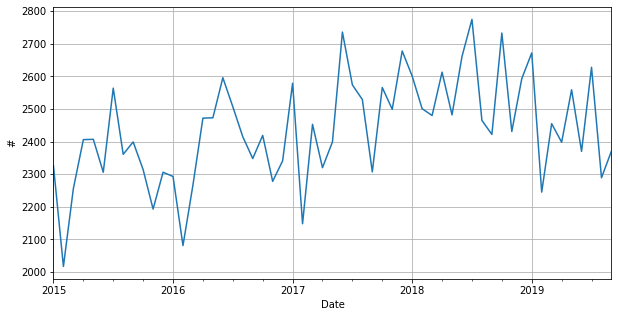



Componentes de la distribución de transacciones


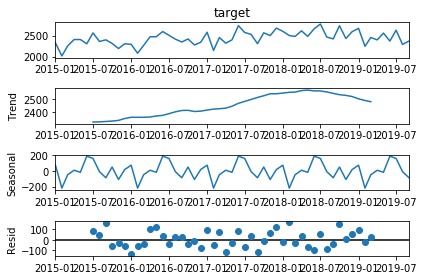



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=2519.223743, expected=2733
predicted=2516.188708, expected=2431
predicted=2672.285134, expected=2593
predicted=2610.190948, expected=2672
predicted=2480.996567, expected=2245
predicted=2553.65723 , expected=2455
predicted=2630.176345, expected=2398
predicted=2562.938021, expected=2559


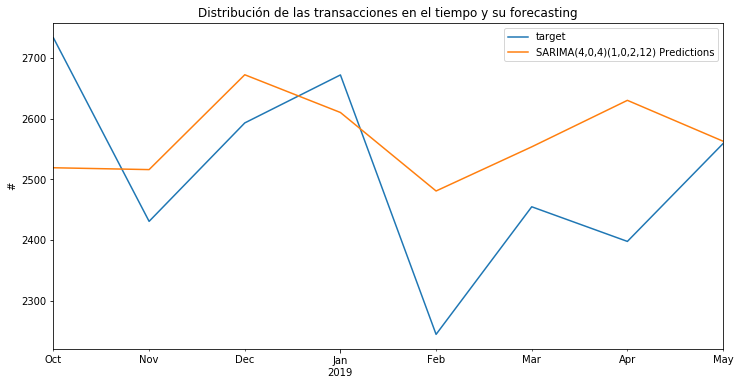



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 151.0020229


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado VA


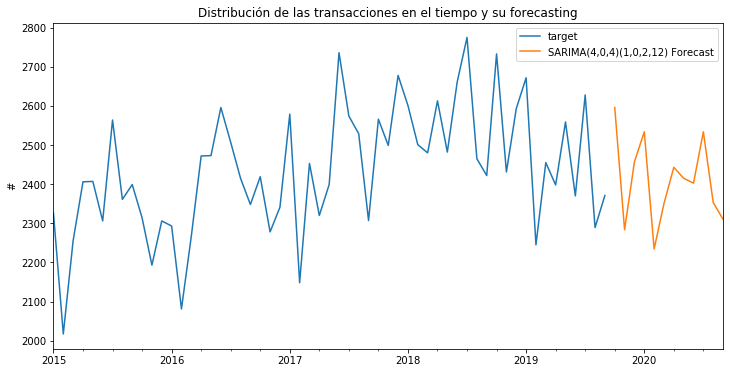



           *****  Estado :   NC  ******




Distribución de transacciones


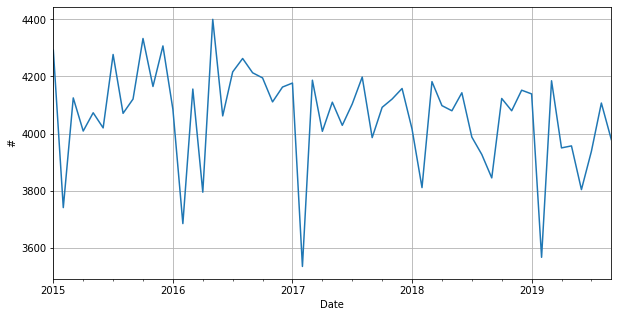



Componentes de la distribución de transacciones


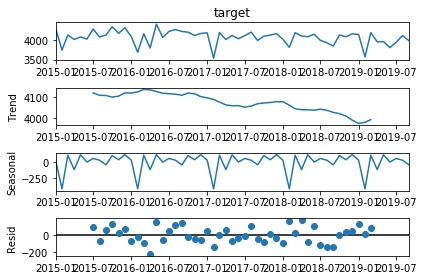



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=4080.281889, expected=4123
predicted=4096.253841, expected=4080
predicted=4107.177076, expected=4152
predicted=4037.798857, expected=4139
predicted=3868.368807, expected=3567
predicted=4113.833399, expected=4185
predicted=4050.126825, expected=3950
predicted=4075.10124 , expected=3957


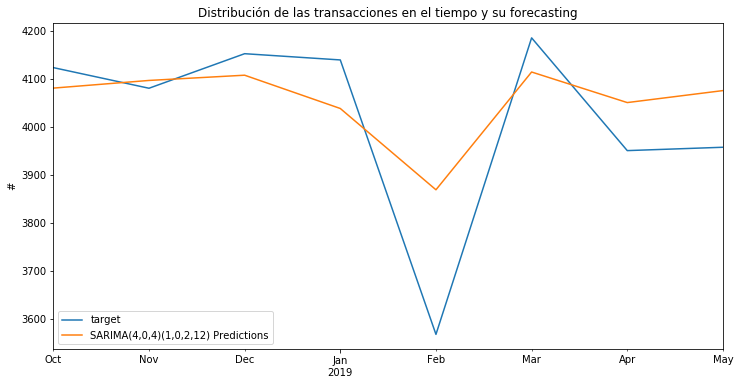



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 129.5187811


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NC


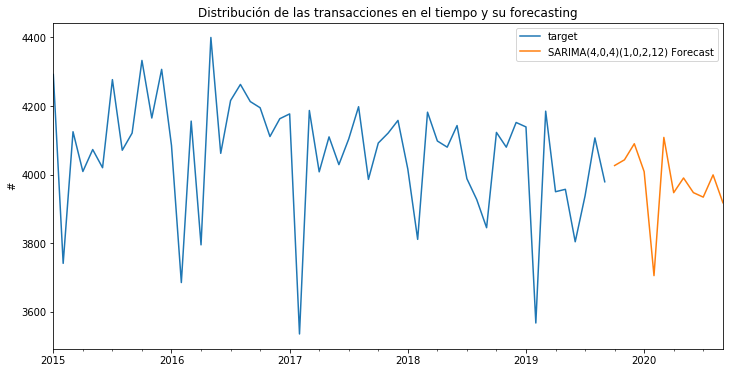



           *****  Estado :   WA  ******




Distribución de transacciones


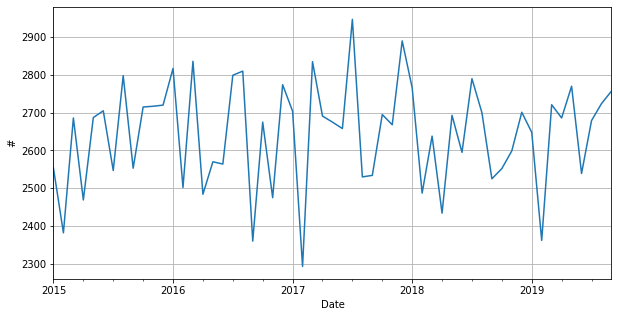



Componentes de la distribución de transacciones


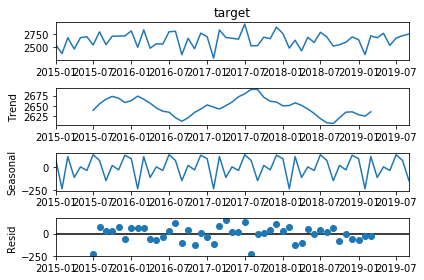



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=2721.428842, expected=2552
predicted=2577.544832, expected=2599
predicted=2796.414651, expected=2701
predicted=2636.077731, expected=2648
predicted=2596.167963, expected=2362
predicted=2692.888744, expected=2721
predicted=2565.261144, expected=2686
predicted=2728.817111, expected=2770


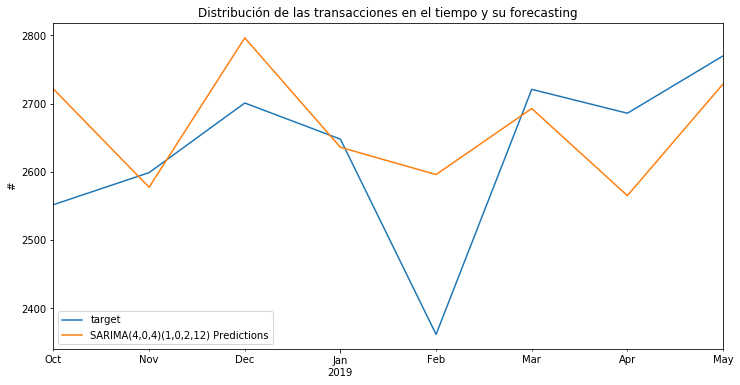



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 117.4262173


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado WA


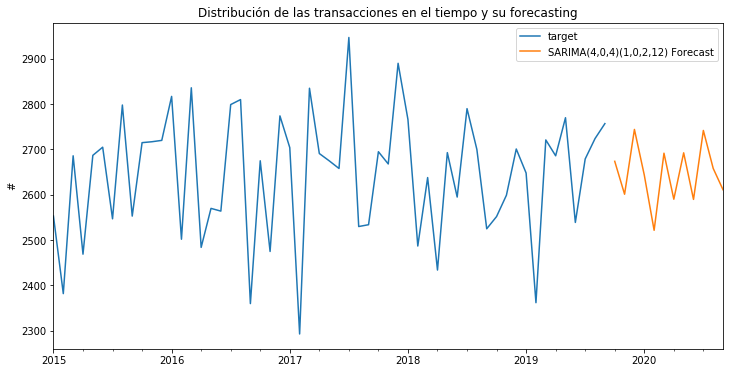



           *****  Estado :   NM  ******




Distribución de transacciones


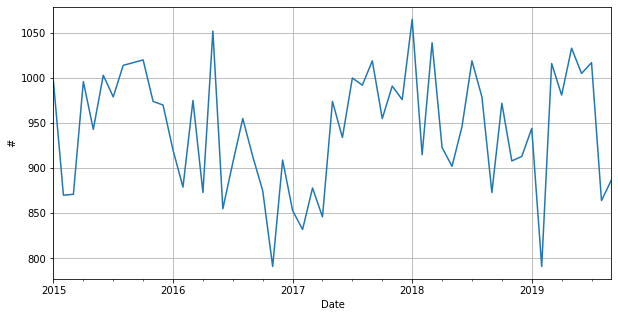



Componentes de la distribución de transacciones


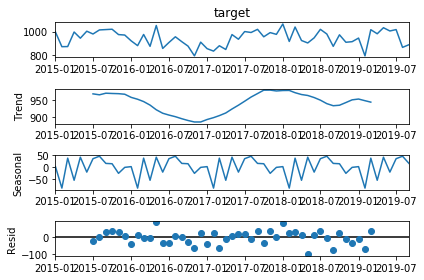



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=948.4611579, expected=972
predicted=926.5941766, expected=908
predicted=933.6389692, expected=913
predicted=927.913621 , expected=944
predicted=923.5136256, expected=791
predicted=930.8138394, expected=1016
predicted=921.2031928, expected=981
predicted=930.6974807, expected=1033


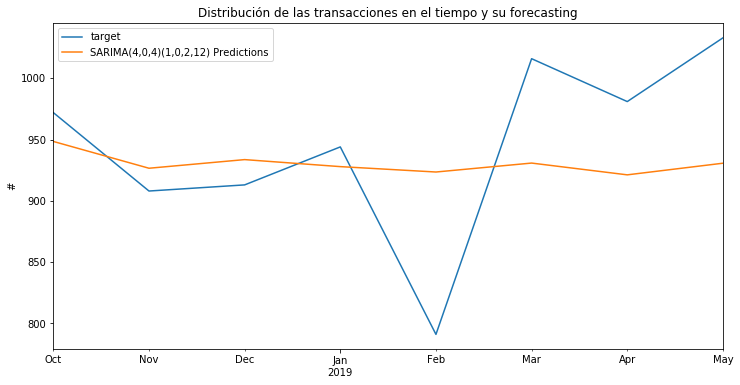



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 71.10077853


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NM


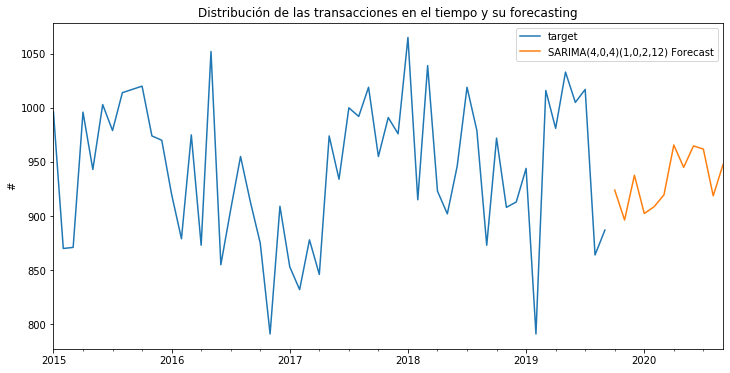



           *****  Estado :   IN  ******




Distribución de transacciones


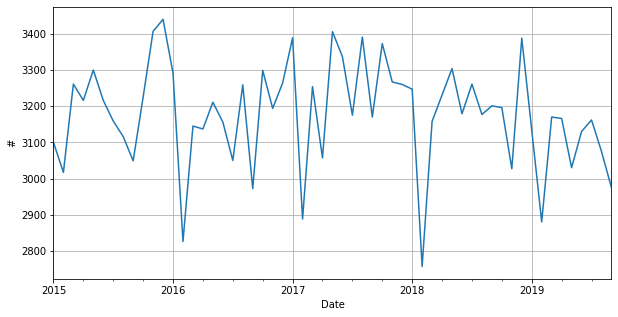



Componentes de la distribución de transacciones


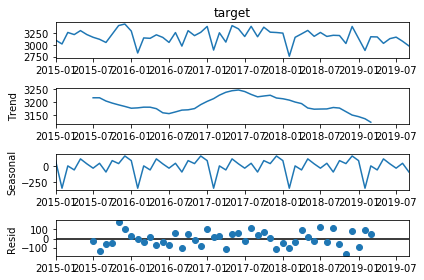



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=3222.586739, expected=3196
predicted=3311.058394, expected=3027
predicted=3240.137481, expected=3388
predicted=3173.794592, expected=3134
predicted=3057.225003, expected=2880
predicted=3114.292675, expected=3170
predicted=3250.251899, expected=3166
predicted=3236.656107, expected=3030


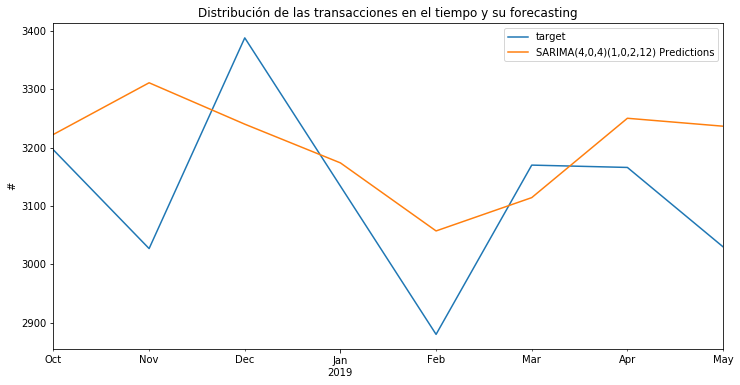



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error:  153.769347


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado IN


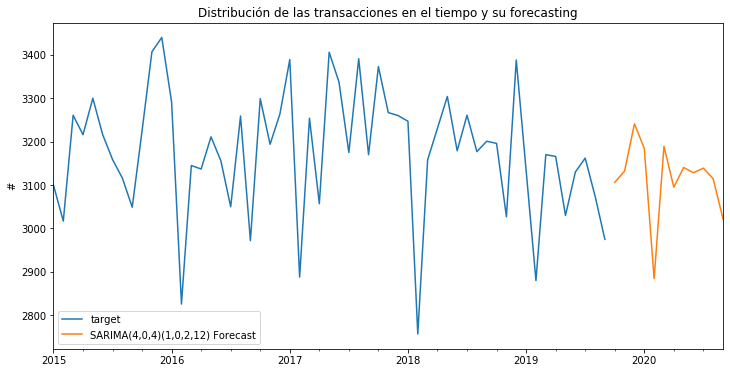



           *****  Estado :   OR  ******




Distribución de transacciones


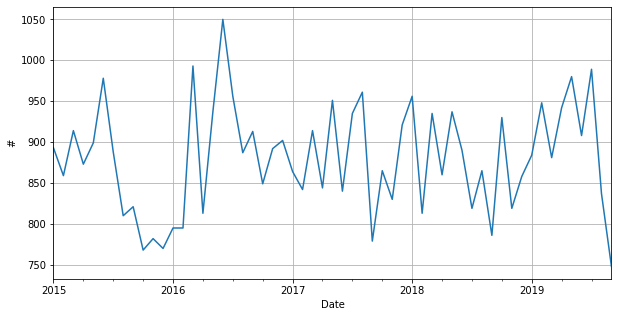



Componentes de la distribución de transacciones


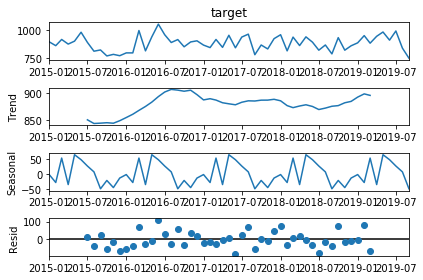



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=788.6537303, expected=930
predicted=773.3619802, expected=819
predicted=812.9427471, expected=858
predicted=851.2705564, expected=884
predicted=766.7509637, expected=948
predicted=870.5160911, expected=881
predicted=795.9905987, expected=942
predicted=856.5435315, expected=980


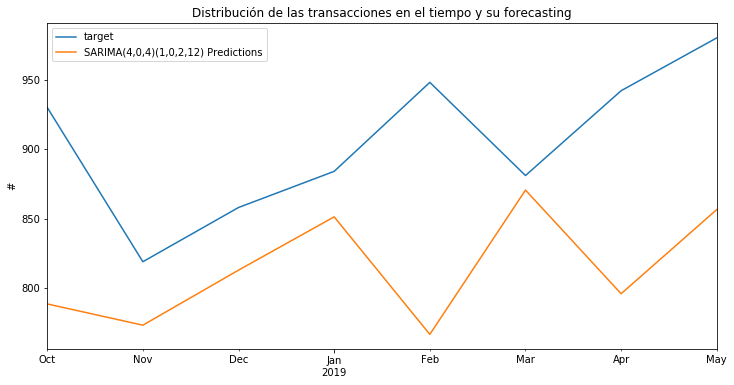



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 108.7912794


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado OR


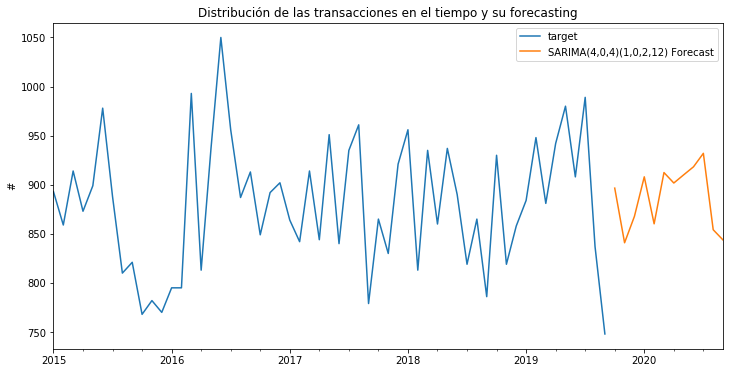



           *****  Estado :   LA  ******




Distribución de transacciones


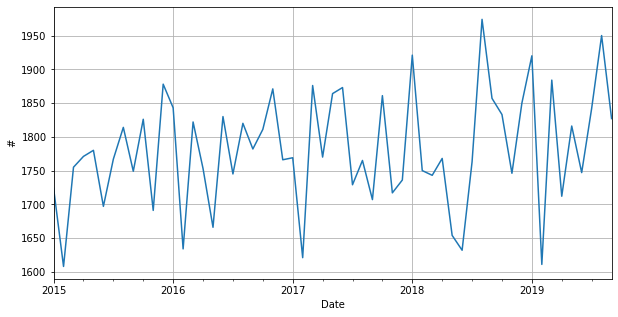



Componentes de la distribución de transacciones


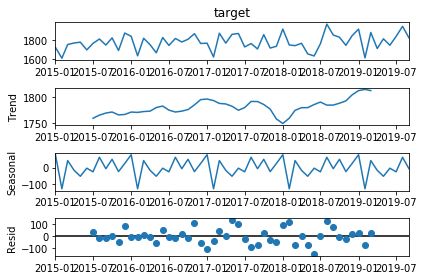



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1794.138698, expected=1833
predicted=1804.347744, expected=1746
predicted=1832.648927, expected=1850
predicted=1782.35048 , expected=1920
predicted=1693.084369, expected=1611
predicted=1846.901161, expected=1884
predicted=1796.925806, expected=1712
predicted=1779.529996, expected=1816


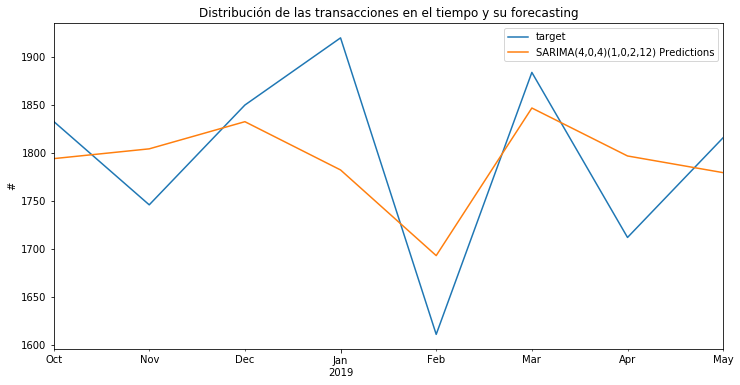



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 71.43155047


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado LA


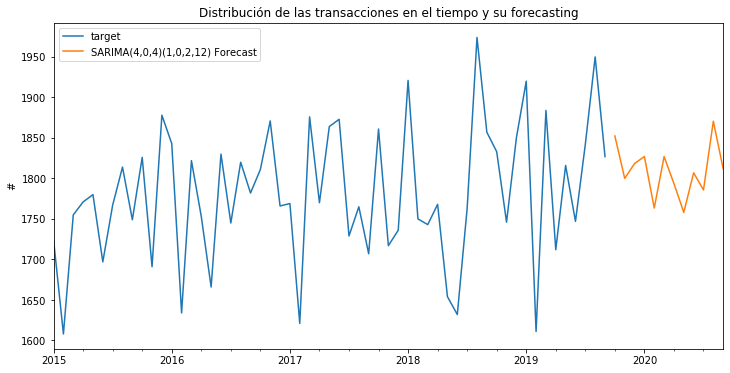



           *****  Estado :   DE  ******




Distribución de transacciones


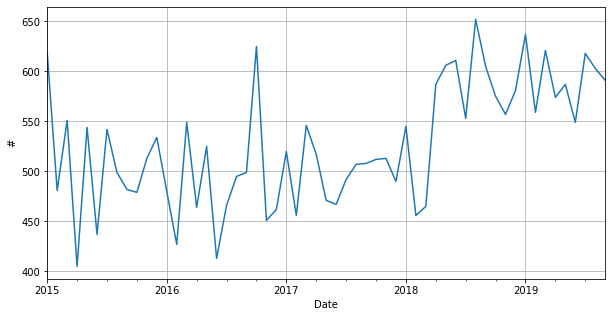



Componentes de la distribución de transacciones


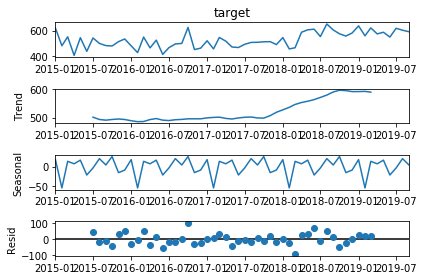



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=586.050715 , expected=575
predicted=611.9544099, expected=557
predicted=571.2830855, expected=581
predicted=612.7765038, expected=637
predicted=586.7207262, expected=559
predicted=594.153133 , expected=621
predicted=605.5722187, expected=574
predicted=567.6871391, expected=587


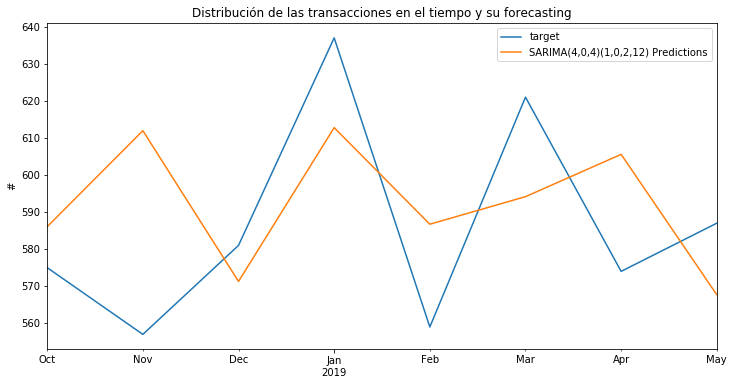



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 28.90131092


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado DE


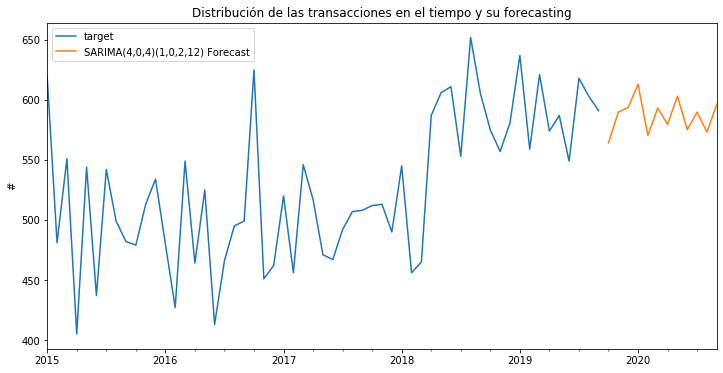



           *****  Estado :   TN  ******




Distribución de transacciones


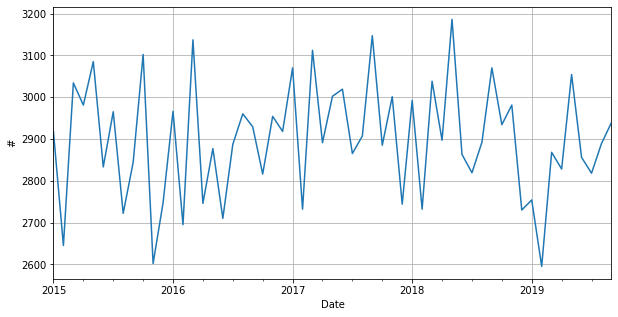



Componentes de la distribución de transacciones


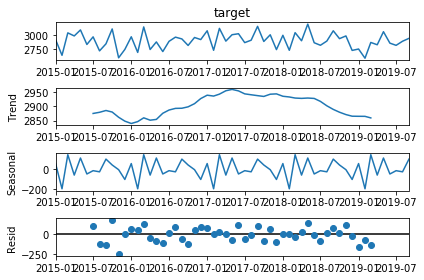



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=2882.08559 , expected=2934
predicted=2974.530641, expected=2981
predicted=2863.344609, expected=2730
predicted=2974.645139, expected=2754
predicted=2851.64984 , expected=2595
predicted=3088.245874, expected=2868
predicted=2849.931032, expected=2828
predicted=3078.95119 , expected=3054


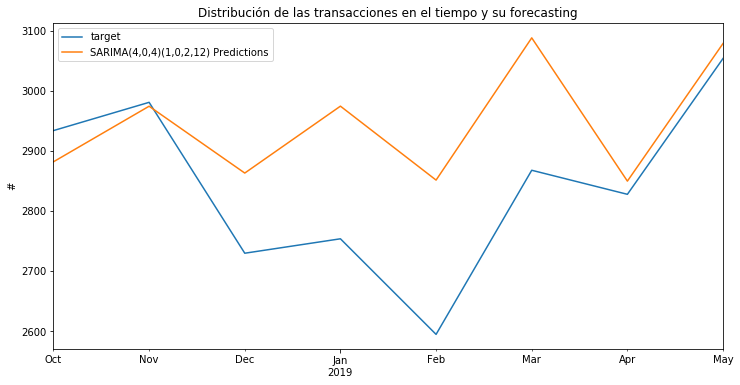



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 151.9386959


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado TN


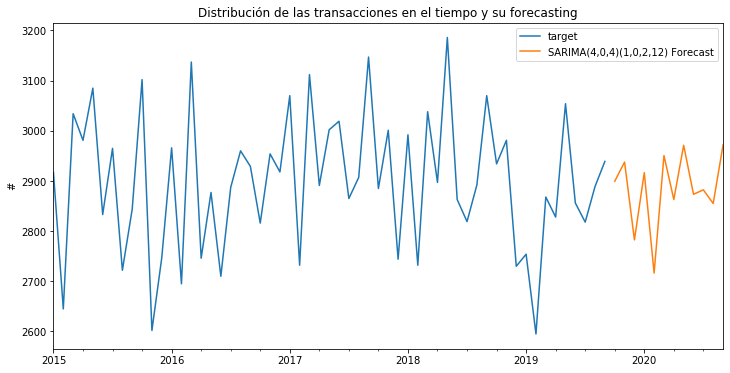



           *****  Estado :   ID  ******




Distribución de transacciones


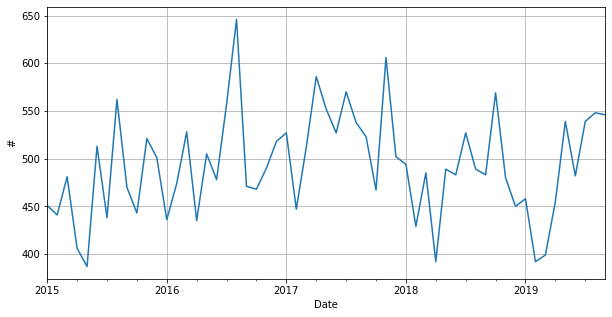



Componentes de la distribución de transacciones


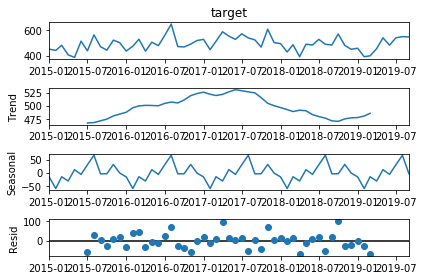



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=458.6207377, expected=569
predicted=508.2783857, expected=480
predicted=487.3399431, expected=450
predicted=479.0511578, expected=458
predicted=457.2247915, expected=392
predicted=494.2522065, expected=399
predicted=472.1019955, expected=455
predicted=479.9531025, expected=539


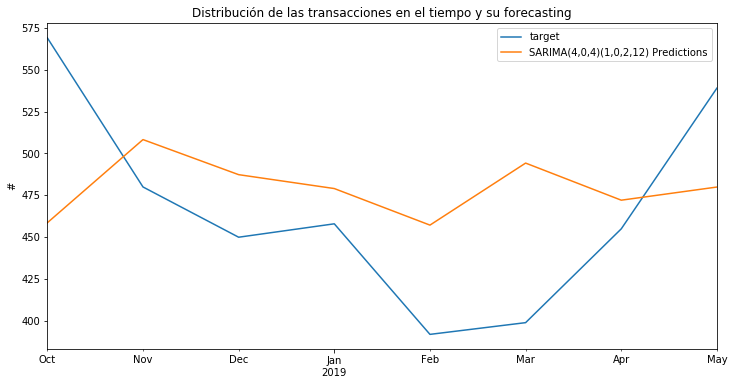



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 63.17331502


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado ID


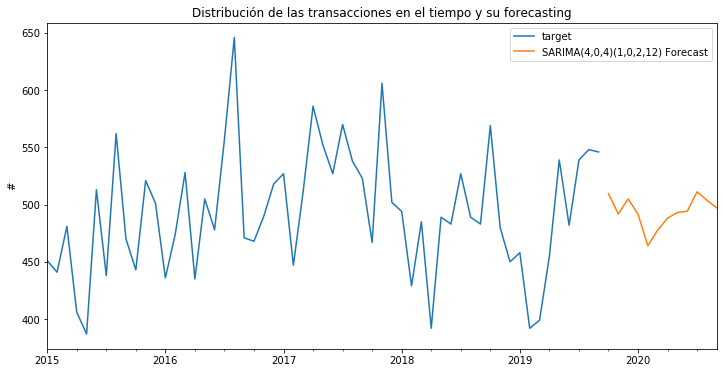



           *****  Estado :   UT  ******




Distribución de transacciones


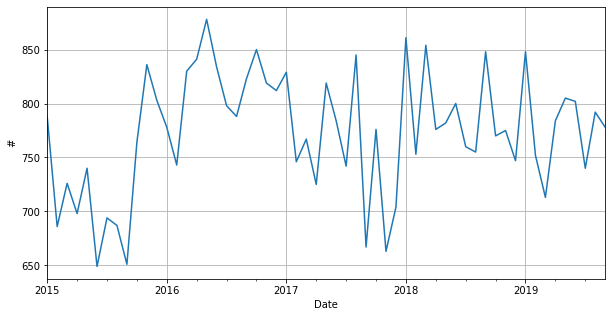



Componentes de la distribución de transacciones


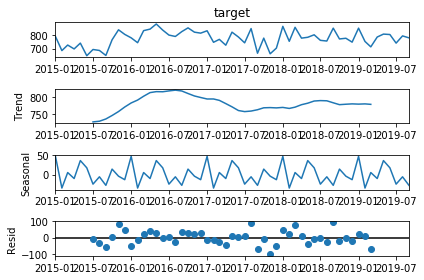



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=822.5248592, expected=770
predicted=913.704958 , expected=775
predicted=829.9296868, expected=747
predicted=798.3745486, expected=848
predicted=788.3145349, expected=752
predicted=769.7288437, expected=713
predicted=831.9399677, expected=784
predicted=831.7454702, expected=805


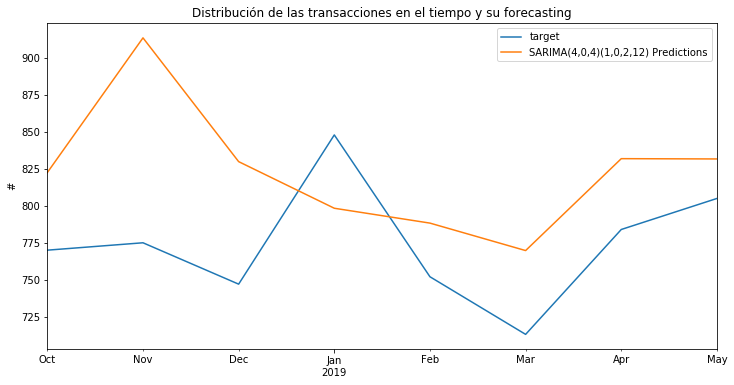



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 69.72124176


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado UT


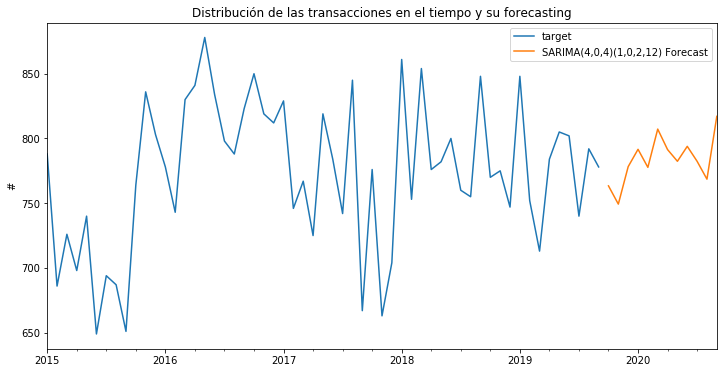



           *****  Estado :   SC  ******




Distribución de transacciones


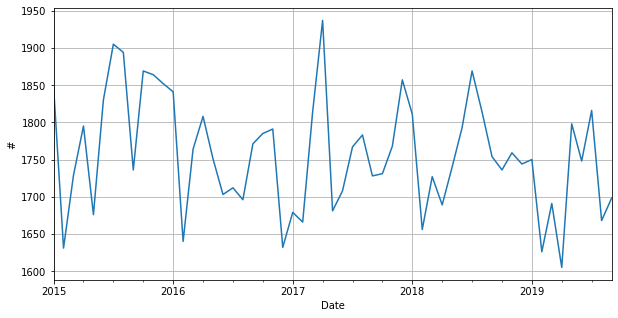



Componentes de la distribución de transacciones


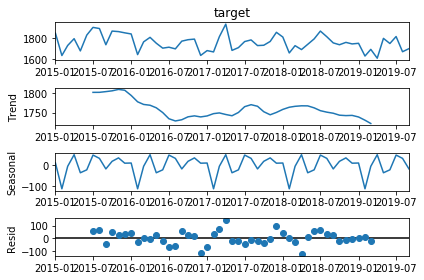



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1815.452576, expected=1736
predicted=1825.593628, expected=1759
predicted=1802.77006 , expected=1744
predicted=1752.022733, expected=1750
predicted=1672.120102, expected=1626
predicted=1767.833024, expected=1691
predicted=1882.548811, expected=1605
predicted=1765.625968, expected=1798


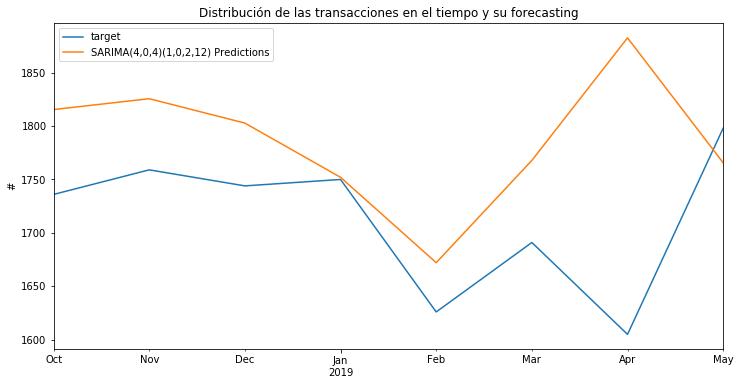



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 111.9805966


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado SC


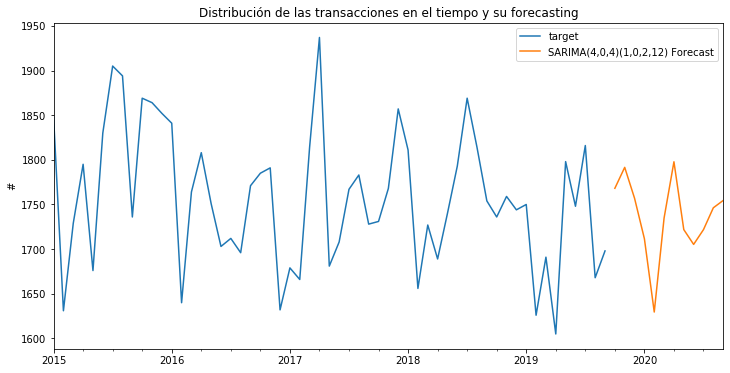



           *****  Estado :   OK  ******




Distribución de transacciones


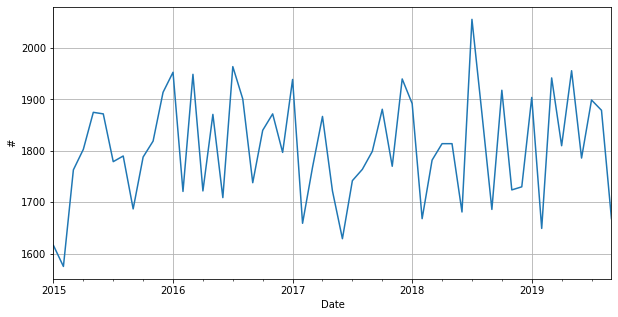



Componentes de la distribución de transacciones


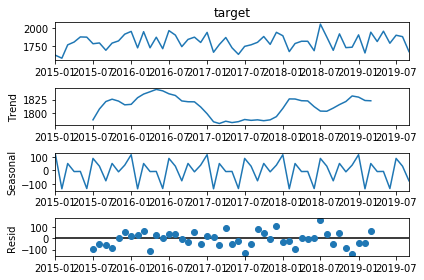



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1840.386691, expected=1918
predicted=1808.183499, expected=1724
predicted=1823.008406, expected=1730
predicted=1910.271974, expected=1904
predicted=1721.831123, expected=1649
predicted=1826.128774, expected=1942
predicted=1829.826366, expected=1810
predicted=1756.190083, expected=1956


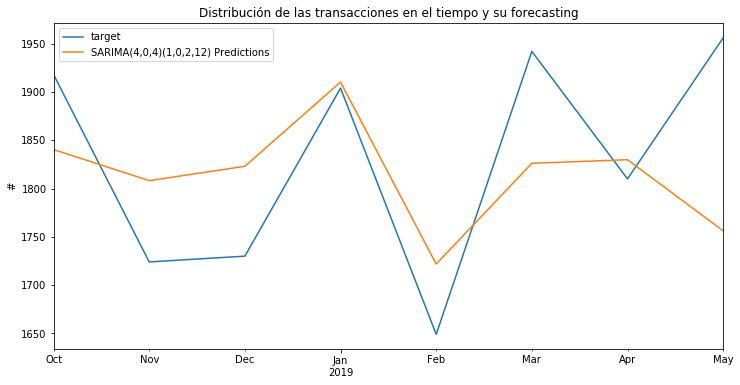



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 100.5287208


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado OK


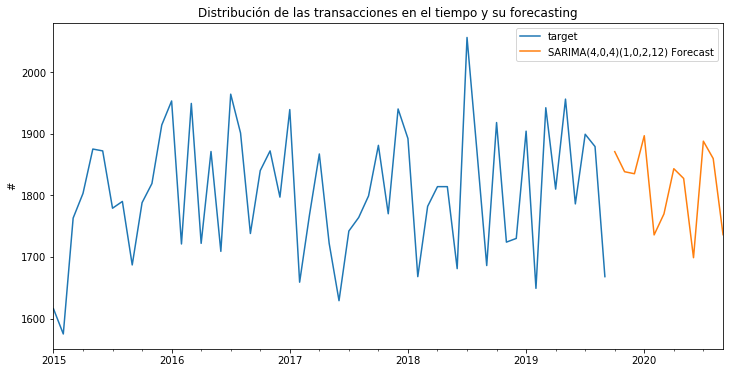



           *****  Estado :   MS  ******




Distribución de transacciones


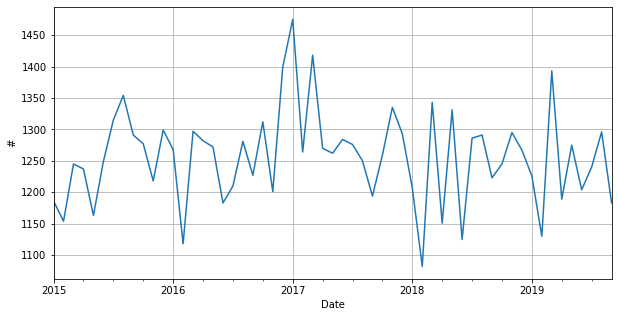



Componentes de la distribución de transacciones


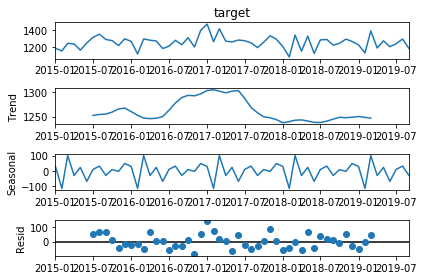



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=1270.94422 , expected=1245
predicted=1266.426055, expected=1295
predicted=1257.144082, expected=1267
predicted=1247.510993, expected=1226
predicted=1226.689415, expected=1130
predicted=1265.829547, expected=1393
predicted=1239.745227, expected=1189
predicted=1268.510879, expected=1275


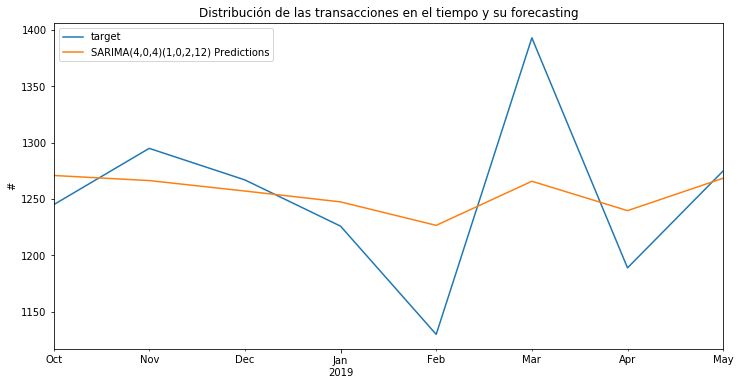



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 61.42860565


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MS


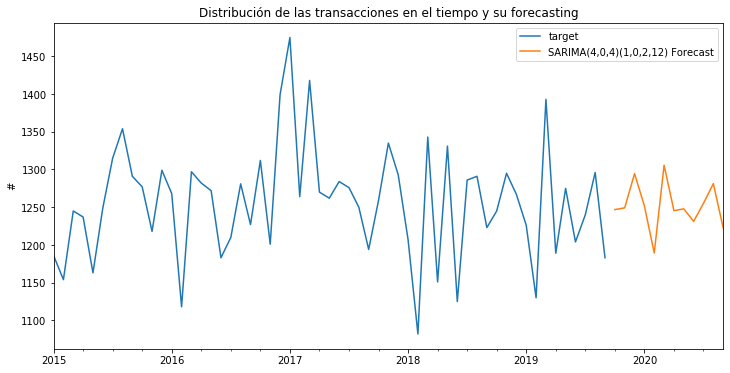



           *****  Estado :   WV  ******




Distribución de transacciones


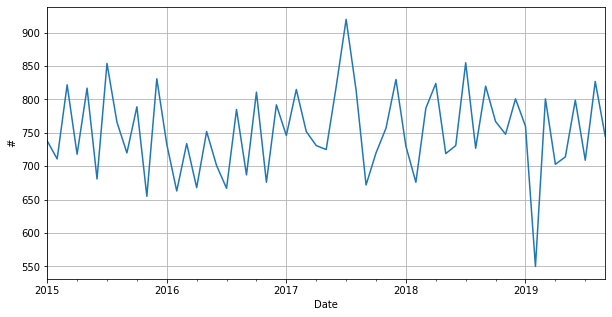



Componentes de la distribución de transacciones


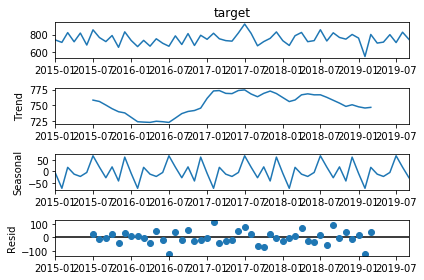



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=664.7870179, expected=767
predicted=798.763343 , expected=748
predicted=804.2041646, expected=801
predicted=757.0155021, expected=760
predicted=725.9162062, expected=550
predicted=778.7785438, expected=801
predicted=778.9017609, expected=703
predicted=762.7123867, expected=714


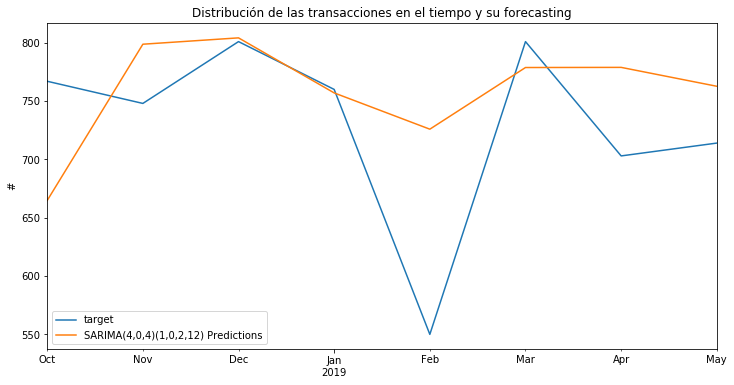



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 81.10014121


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado WV


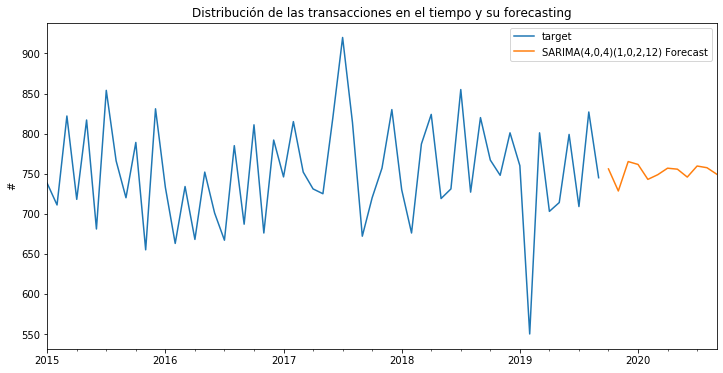



           *****  Estado :   ND  ******




Distribución de transacciones


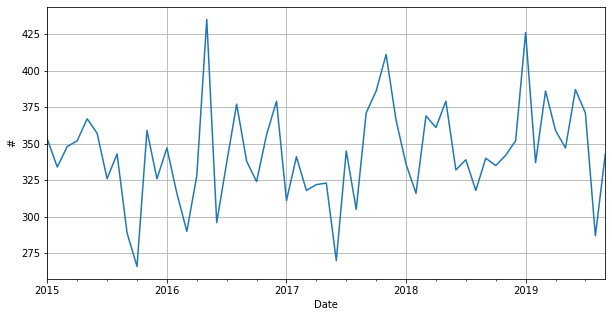



Componentes de la distribución de transacciones


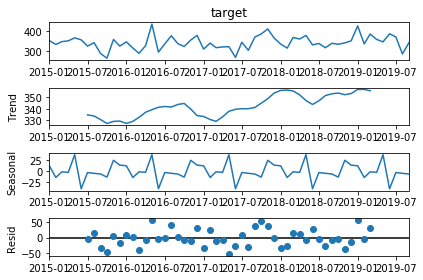



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=335.5031701, expected=335
predicted=354.4538947, expected=342
predicted=333.4909649, expected=352
predicted=343.609313 , expected=426
predicted=335.5135118, expected=337
predicted=344.4824549, expected=386
predicted=340.5853675, expected=359
predicted=364.2254705, expected=347


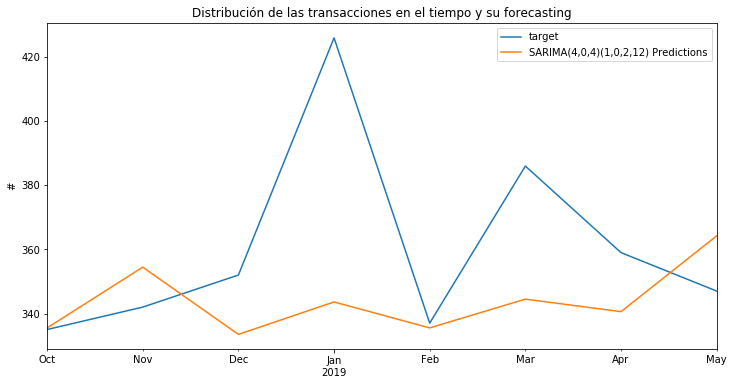



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error:  34.7273201


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado ND


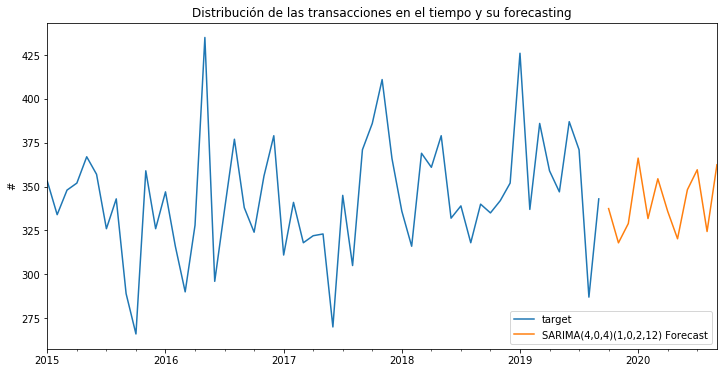



           *****  Estado :   RI  ******




Distribución de transacciones


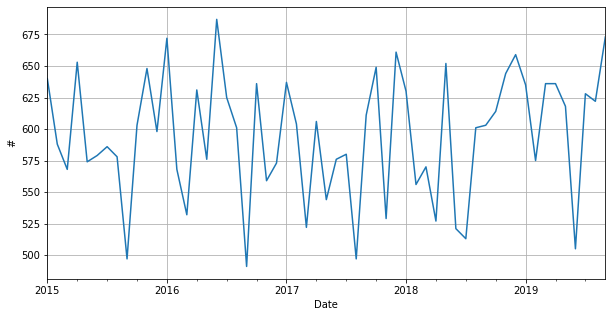



Componentes de la distribución de transacciones


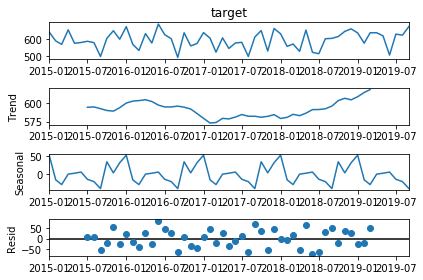



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=583.4811381, expected=614
predicted=576.044759 , expected=644
predicted=635.0023015, expected=659
predicted=591.0303555, expected=635
predicted=556.489688 , expected=575
predicted=596.8262674, expected=636
predicted=583.0478243, expected=636
predicted=591.064508 , expected=618


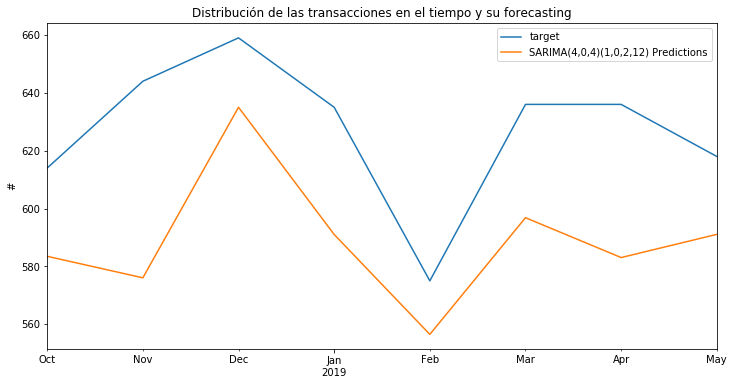



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error:  41.0262134


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado RI


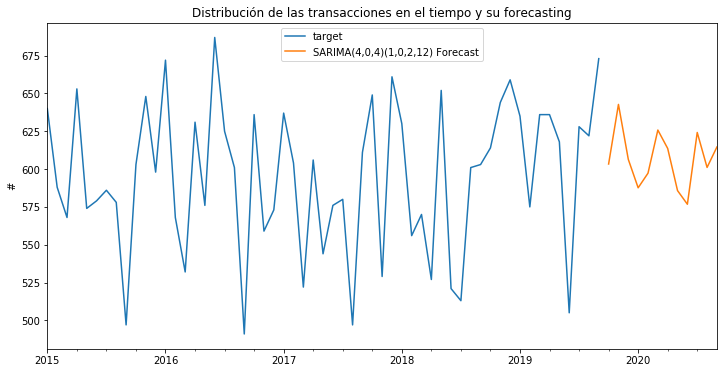



           *****  Estado :   NE  ******




Distribución de transacciones


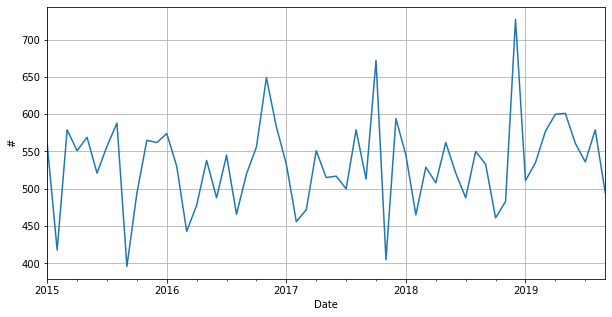



Componentes de la distribución de transacciones


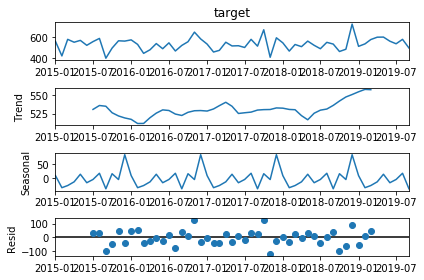



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=519.3227888, expected=461
predicted=585.6318122, expected=483
predicted=522.2939761, expected=727
predicted=568.9413075, expected=511
predicted=482.8732669, expected=535
predicted=511.7405095, expected=577
predicted=531.7546187, expected=600
predicted=522.5332384, expected=601


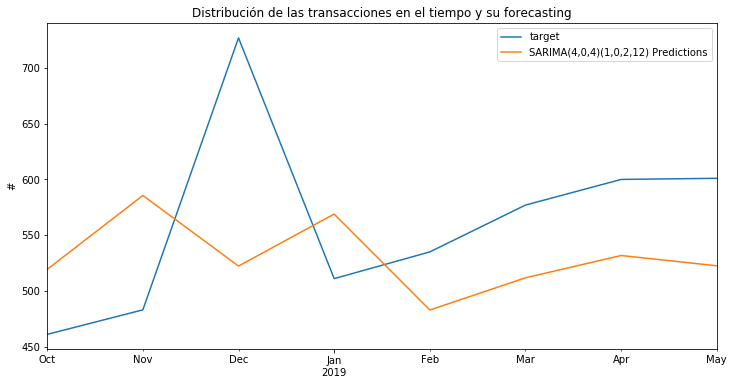



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 98.09883412


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado NE


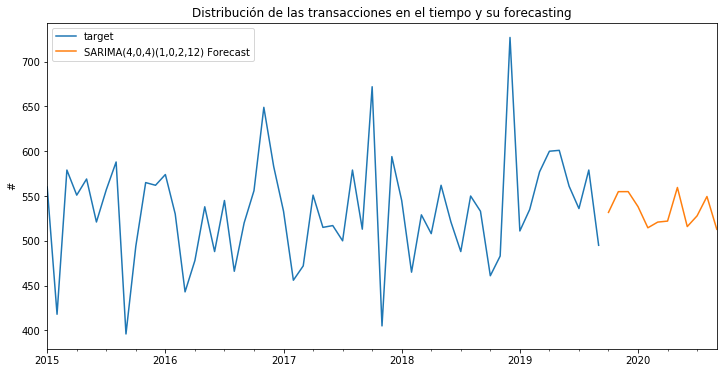



           *****  Estado :   WY  ******




Distribución de transacciones


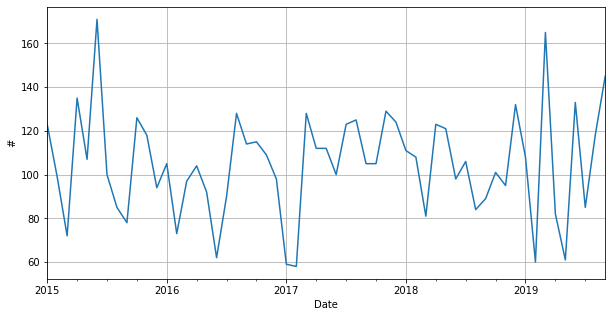



Componentes de la distribución de transacciones


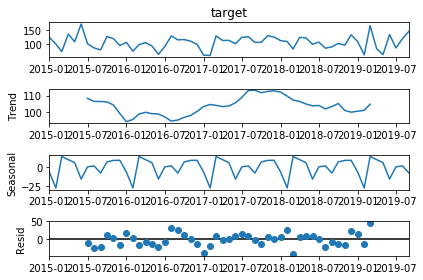



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=94.73290757, expected=101
predicted=98.58319062, expected=95
predicted=110.664983 , expected=132
predicted=102.9454623, expected=108
predicted=110.0156325, expected=60
predicted=107.0437433, expected=165
predicted=94.79055695, expected=82
predicted=100.4723549, expected=61


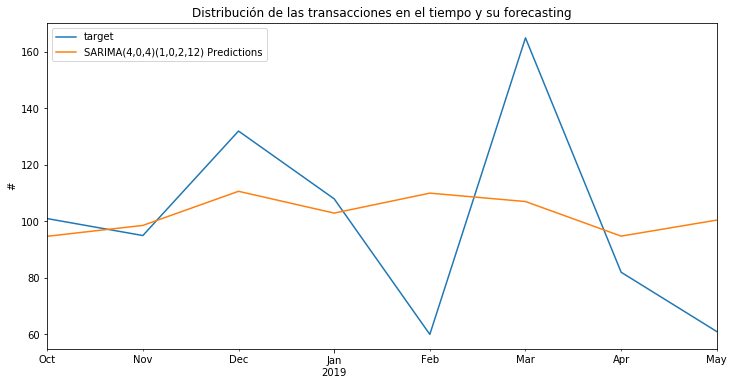



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 31.84926086


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado WY


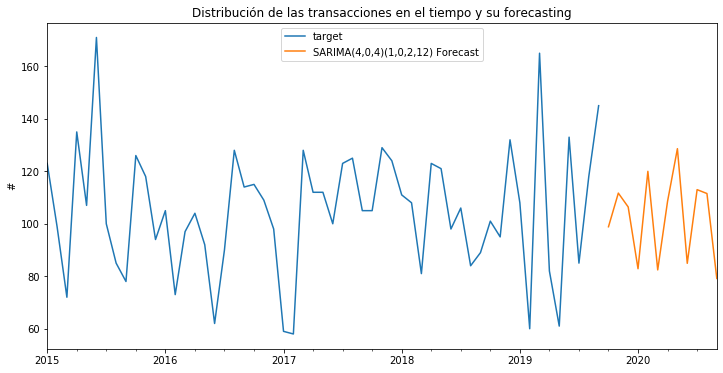



           *****  Estado :   KS  ******




Distribución de transacciones


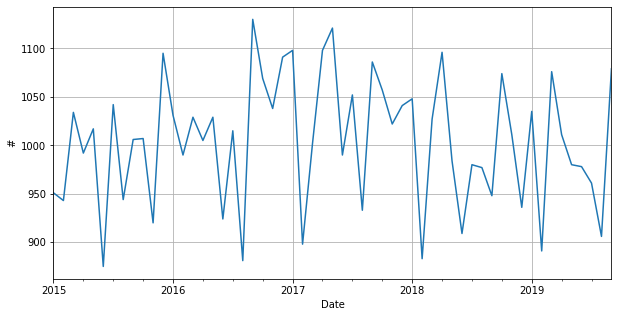



Componentes de la distribución de transacciones


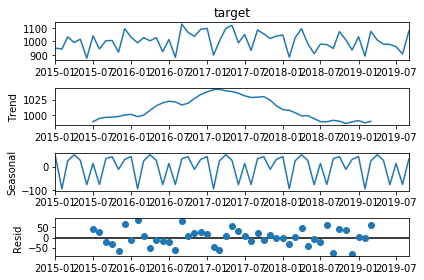



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=960.0180359, expected=1074
predicted=908.4489409, expected=1011
predicted=958.2357074, expected=936
predicted=928.1561774, expected=1035
predicted=874.029311 , expected=891
predicted=944.7543385, expected=1076
predicted=950.0389058, expected=1011
predicted=895.4738347, expected=980


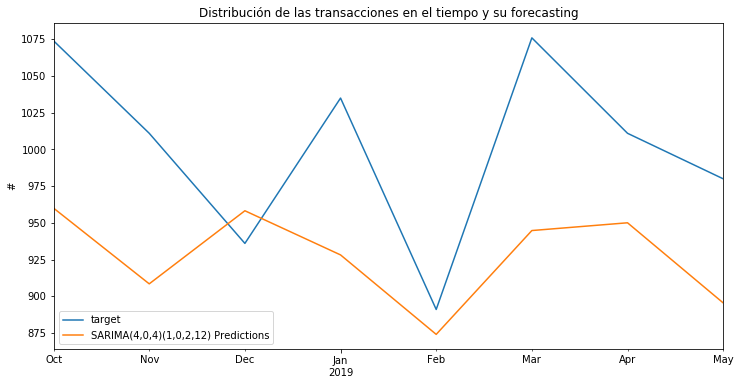



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 89.29795108


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado KS


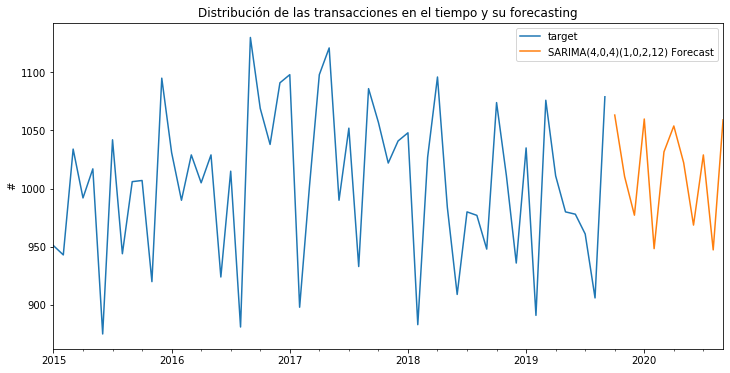



           *****  Estado :   SD  ******




Distribución de transacciones


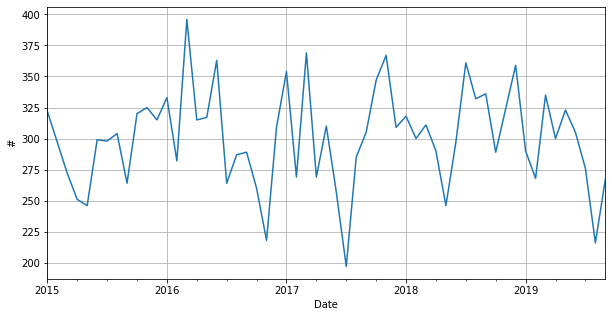



Componentes de la distribución de transacciones


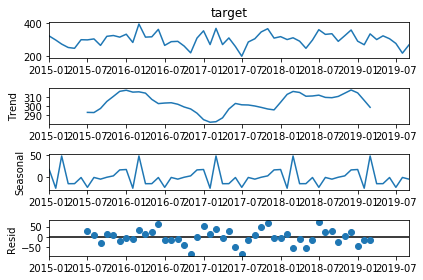



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=311.2452527, expected=289
predicted=294.6312017, expected=324
predicted=310.5663554, expected=359
predicted=302.8450418, expected=290
predicted=303.5436318, expected=268
predicted=307.7581926, expected=335
predicted=299.7729674, expected=300
predicted=309.8550864, expected=323


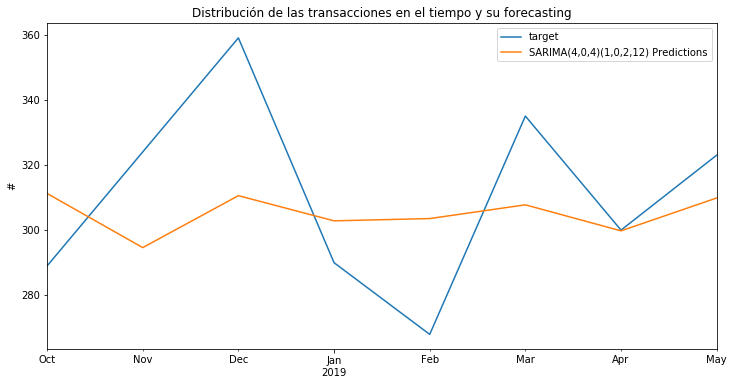



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 27.49203688


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado SD


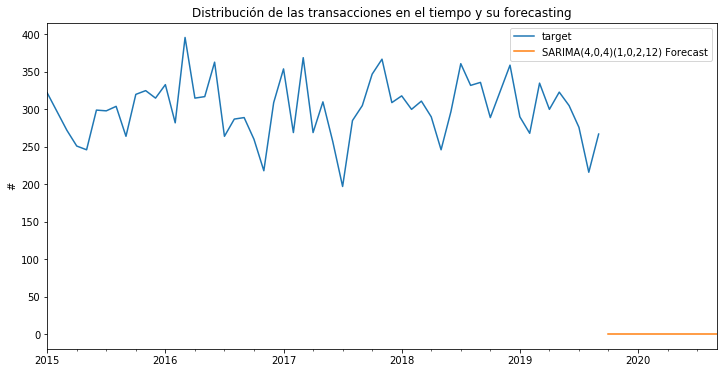



           *****  Estado :   MT  ******




Distribución de transacciones


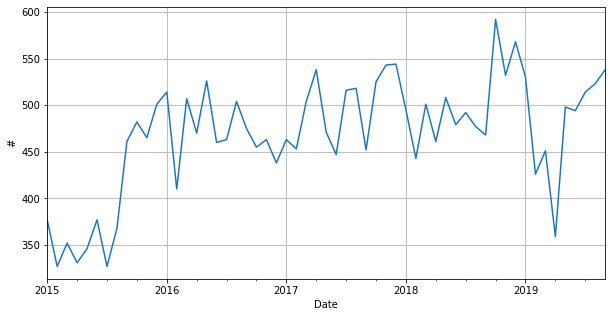



Componentes de la distribución de transacciones


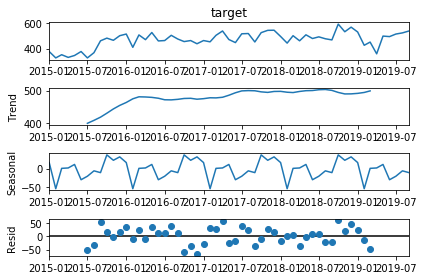



Dividimos la base de datos




Hacemos el forecasting.   ** Modelo SARIMAX**


Hacemos las predicciones


Comparamos las predicciones con los datos de la base de datos
predicted=493.9280875, expected=592
predicted=498.9985664, expected=532
predicted=449.9212114, expected=568
predicted=464.839816 , expected=530
predicted=507.2238723, expected=426
predicted=515.5400715, expected=451
predicted=501.8954688, expected=359
predicted=486.8586578, expected=498


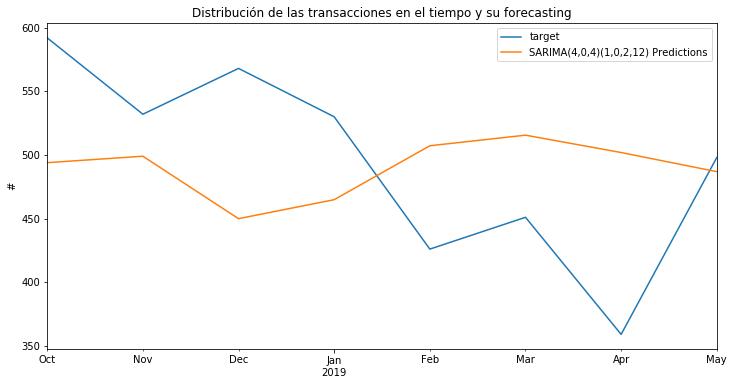



* Calculamos el error del ajuste
SARIMA(4,0,4)(1,0,2,12) RMSE Error: 86.74793031


Aplicamos el modelo a toda la base de datos


FORECASTING para el estado MT


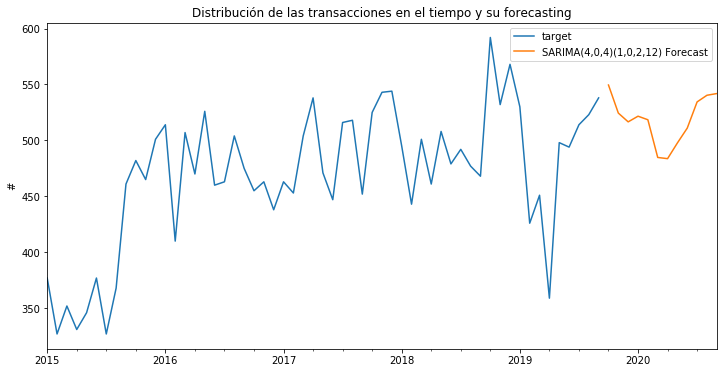

In [56]:
estados, media, errors = forecasting_analysis(df)

#### Identificación de los estados más lucrativos

In [59]:
df_forc = pd.DataFrame()
df_forc['Merchant State'] = estados
df_forc['Sales'] = media
df_forc['Errors'] = errors

,Merchant State,Sales,Errors
0,CA,14262.980709,0.018226
1,MN,1576.017881,0.112193
2,IL,4791.185106,0.051600
3,AK,94.576639,0.152148
4,NJ,3312.877344,0.036416


In [66]:
df_estado = df.groupby('Merchant State')['target'].mean()
df_estado = df_estado.reset_index(drop = False)

df_forc = pd.merge(df_forc, df_estado, on = 'Merchant State', how='inner')

,Merchant State,target
0,AK,0.000000
1,AL,0.000180
2,AR,0.000111


,Merchant State,Sales,Errors,target
0,CA,14262.980709,0.018226,0.000171
1,MN,1576.017881,0.112193,0.000206
2,IL,4791.185106,0.051600,0.000113
3,AK,94.576639,0.152148,0.000000
4,NJ,3312.877344,0.036416,0.000267


### Creación de la figura de mérito (FoM). 

FoM indica qué estados presentarán mayor número de transacciones con una menor tasa de fraude. 

**FoM = Número transacciones esperadas / tasa de fraude media**

In [86]:
df_forc['FoM'] = df_forc['Sales'] / (1 + df_forc['target'])
df_forc = df_forc.sort_values(by = 'FoM', ascending = False)
df_forc.index = estados

#### FoM para todos los estados

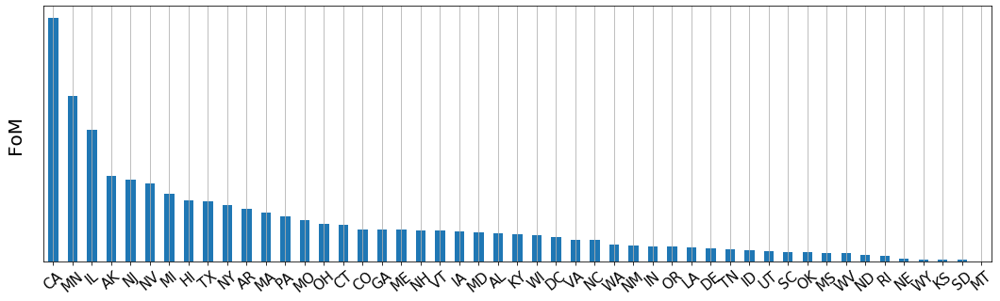

In [101]:
plt.figure(figsize = (18,5))
df_forc['FoM'].plot.bar()
plt.grid()
plt.ylabel('FoM', size = 20, labelpad = 20)
plt.xticks(rotation = 40, fontsize = 15);
plt.yticks([]);

#### FoM para los 10 mejores estados.

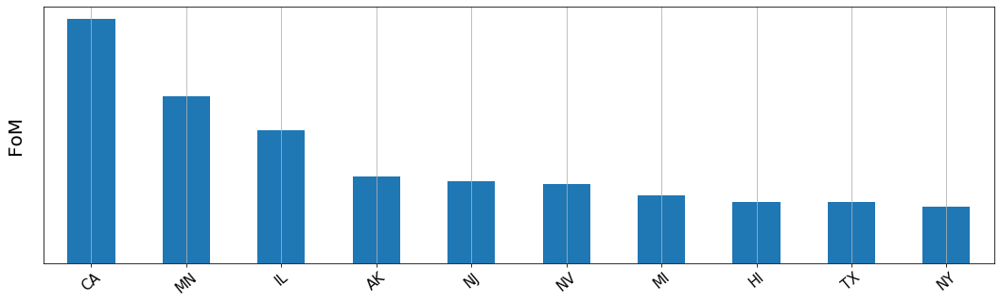

In [103]:
plt.figure(figsize = (18,5))
df_forc['FoM'].head(10).plot.bar()
plt.grid()
plt.ylabel('FoM', size = 20, labelpad = 20)
plt.xticks(rotation = 40, fontsize = 15);
plt.yticks([]);

Estos serían los 10 estados con un mayor número de transacciones esperadas y una menor tasa de fraude. 